In [ ]:
import torch
from torch import nn, optim
from torchvision import datasets, transforms
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from math import log2
import numpy as np
import os
from tqdm import tqdm
import matplotlib.pyplot as plt

# Constants
DATASET = 'STYLEGAN'
START_TRAIN_IMG_SIZE = 4
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
LR = 1e-3
BS = [256, 256, 128, 64, 32, 16]
CHANNELIMAGE = 3
Z_DIM = 512
W_DIM = 512
IN_CHANNELS = 512
LAMBDA_GP = 10
PROGRESSIVE_EPOCHS = [40] * len(BS)

def loaddata(image_size):
    transform = transforms.Compose(
        [
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.Normalize(
                [0.5 for _ in range(CHANNELIMAGE)],
                [0.5 for _ in range(CHANNELIMAGE)],
            ),
        ]
    )
    batch_size = BS[int(log2(image_size / 4))]
    dataset = datasets.ImageFolder(root=DATASET, transform=transform)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return loader, dataset

def save_and_display_images(gen, steps, epoch, num_images=9):
    gen.eval()
    os.makedirs(f"Finalimages/step_{steps}", exist_ok=True)
    alpha = 1.0
    for i in range(num_images):
        with torch.no_grad():
            noise = torch.randn(1, Z_DIM).to(DEVICE)
            img = gen(noise, alpha, steps)
            img_path = f"Finalimages/step_{steps}/img_{epoch}_{i}.png"
            save_image(img * 0.5 + 0.5, img_path)
            plt.imshow((img[0].permute(1, 2, 0).cpu().numpy() + 1) / 2)
            plt.title(f"Step {steps}, Epoch {epoch}")
            plt.axis("off")
            plt.show()
    gen.train()


def trainloop(critic, gen, loader, dataset, step, alpha, opt_critic, opt_gen):
    loop = tqdm(loader, leave=True)
    loss_gen_list = []
    loss_critic_list = []

    for batch_idx, (real, _) in enumerate(loop):
        real = real.to(DEVICE)
        cur_batch_size = real.shape[0]
        noise = torch.randn(cur_batch_size, Z_DIM).to(DEVICE)

        fake = gen(noise, alpha, step)
        critic_real = critic(real, alpha, step)
        critic_fake = critic(fake.detach(), alpha, step)
        gp = gradient_penalty(critic, real, fake, alpha, step, DEVICE)

        # Critic loss
        loss_critic = (
            -(torch.mean(critic_real) - torch.mean(critic_fake))
            + LAMBDA_GP * gp
            + 0.001 * torch.mean(critic_real ** 2)
        )
        critic.zero_grad()
        loss_critic.backward()
        opt_critic.step()

        # Generator loss
        gen_fake = critic(fake, alpha, step)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        alpha += cur_batch_size / (PROGRESSIVE_EPOCHS[step] * 0.5 * len(dataset))
        alpha = min(alpha, 1)

        loop.set_postfix(gp=gp.item(), loss_critic=loss_critic.item())

        loss_gen_list.append(loss_gen.item())
        loss_critic_list.append(loss_critic.item())

    return alpha, loss_gen_list, loss_critic_list


In [ ]:
def get_loader(image_size):
    trainsform = transforms.Compose(
        [transforms.Resize((image_size, image_size)),
         transforms.ToTensor(),
         transforms.RandomHorizontalFlip(p=0.5),
         transforms.Normalize(
            [0.5 for _ in range(CHANNELIMAGE)],
            [0.5 for _ in range(CHANNELIMAGE)],
         )
        ]
    )
    batch_size = BS[int(log2(image_size/4))]
    dataset = datasets.ImageFolder(root=DATASET, transform=trainsform)
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True
    )
    return loader, dataset

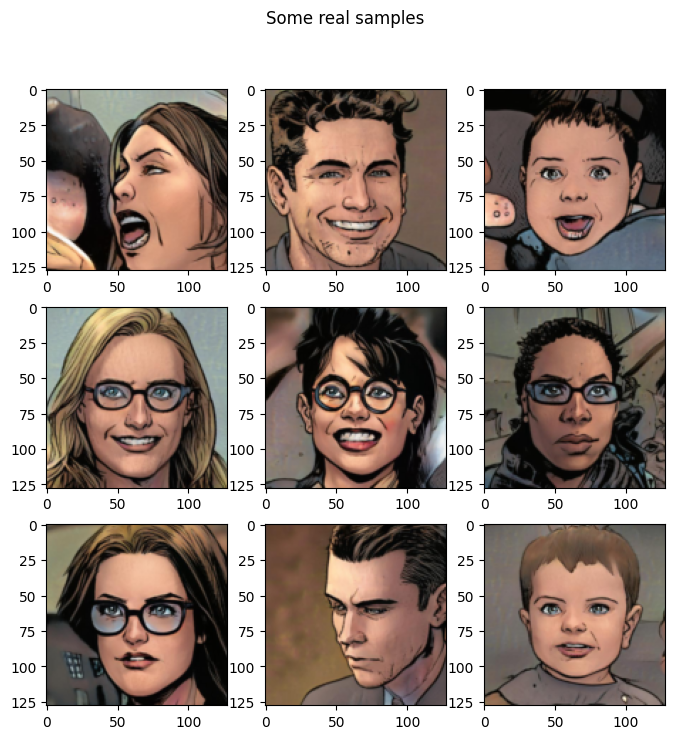

In [ ]:
def check_loader():
    loader,_ = get_loader(128)
    cloth,_  = next(iter(loader))
    _,ax     = plt.subplots(3,3,figsize=(8,8))
    plt.suptitle('Some real samples')
    ind = 0
    for k in range(3):
        for kk in range(3):
            ax[k][kk].imshow((cloth[ind].permute(1,2,0)+1)/2)
            ind +=1
check_loader()

In [ ]:

factors = [1,1,1,1/2,1/4,1/8,1/16,1/32]

In [ ]:
class WSLinear(nn.Module):
    def __init__(
        self, in_features, out_features
    ):
        super(WSLinear,self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        self.scale  = (2/in_features) ** 0.5
        self.bias   = self.linear.bias
        self.linear.bias = None

        nn.init.normal_(self.linear.weight)
        nn.init.zeros_(self.bias)

    def forward(self,x):
        return self.linear(x * self.scale) + self.bias

In [ ]:
class PixenNorm(nn.Module):
    def __init__(self):
        super(PixenNorm, self).__init__()
        self.epsilon = 1e-8
    def forward(self,x ):
        return x / torch.sqrt(torch.mean(x**2, dim=1, keepdim=True)+  self.epsilon)

In [ ]:
class MappingNetwork(nn.Module):
    def __init__(self, z_dim, w_dim):
        super().__init__()
        self.mapping = nn.Sequential(
            PixenNorm(),
            WSLinear(z_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
        )

    def forward(self,x):
        return self.mapping(x)

In [ ]:
class AdaIN(nn.Module):
    def __init__(self, channels, w_dim):
        super().__init__()
        self.instance_norm = nn.InstanceNorm2d(channels)
        self.style_scale   = WSLinear(w_dim, channels)
        self.style_bias    = WSLinear(w_dim, channels)

    def forward(self,x,w):
        x = self.instance_norm(x)
        style_scale = self.style_scale(w).unsqueeze(2).unsqueeze(3)
        style_bias  = self.style_bias(w).unsqueeze(2).unsqueeze(3)
        return style_scale * x + style_bias

In [ ]:
class injectNoise(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.weight = nn.Parameter(torch.zeros(1,channels,1,1))

    def forward(self, x):
        noise = torch.randn((x.shape[0], 1, x.shape[2], x.shape[3]), device = x.device)
        return x + self.weight + noise

In [ ]:
class GenBlock(nn.Module):
    def __init__(self, in_channel, out_channel, w_dim):
        super(GenBlock, self).__init__()
        self.conv1 = WSConv2d(in_channel, out_channel)
        self.conv2 = WSConv2d(out_channel, out_channel)
        self.leaky = nn.LeakyReLU(0.2, inplace=True)
        self.inject_noise1 = injectNoise(out_channel)
        self.inject_noise2 = injectNoise(out_channel)
        self.adain1 = AdaIN(out_channel, w_dim)
        self.adain2 = AdaIN(out_channel, w_dim)
    def forward(self, x,w):
        x = self.adain1(self.leaky(self.inject_noise1(self.conv1(x))), w)
        x = self.adain2(self.leaky(self.inject_noise2(self.conv2(x))), w)
        return x

In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim, w_dim, in_channels, img_channels=3):
        super().__init__()
        self.starting_cte = nn.Parameter(torch.ones(1, in_channels, 4,4))
        self.map = MappingNetwork(z_dim, w_dim)
        self.initial_adain1 = AdaIN(in_channels, w_dim)
        self.initial_adain2 = AdaIN(in_channels, w_dim)
        self.initial_noise1 = injectNoise(in_channels)
        self.initial_noise2 = injectNoise(in_channels)
        self.initial_conv   = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)
        self.leaky          = nn.LeakyReLU(0.2, inplace=True)

        self.initial_rgb    = WSConv2d(
            in_channels, img_channels, kernel_size = 1, stride=1, padding=0
        )
        self.prog_blocks, self.rgb_layers = (
            nn.ModuleList([]),
            nn.ModuleList([self.initial_rgb])
        )

        for i in range(len(factors)-1):
            conv_in_c  = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i+1])
            self.prog_blocks.append(GenBlock(conv_in_c, conv_out_c, w_dim))
            self.rgb_layers.append(WSConv2d(conv_out_c, img_channels, kernel_size = 1, stride=1, padding=0))

    def fade_in(self, alpha, upscaled, generated):
        return torch.tanh(alpha * generated + (1-alpha ) * upscaled)

    def forward(self, noise, alpha, steps):
        w = self.map(noise)
        x = self.initial_adain1(self.initial_noise1(self.starting_cte),w)
        x = self.initial_conv(x)
        out = self.initial_adain2(self.leaky(self.initial_noise2(x)), w)

        if steps == 0:
            return self.initial_rgb(x)

        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor=2, mode = 'bilinear')
            out      = self.prog_blocks[step](upscaled,w)

        final_upscaled = self.rgb_layers[steps-1](upscaled)
        final_out      = self.rgb_layers[steps](out)

        return self.fade_in(alpha, final_upscaled, final_out)

In [ ]:
class WSConv2d(nn.Module):
    def __init__(
        self, in_channels, out_channels, kernel_size=3, stride=1, padding=1
    ):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (2 / (in_channels * (kernel_size ** 2))) ** 0.5
        self.bias = self.conv.bias
        self.conv.bias = None

        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv(x * self.scale) + self.bias.view(1, self.bias.shape[0], 1, 1)

In [ ]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.leaky(self.conv2(x))
        return x

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels, img_channels=3):
        super(Discriminator, self).__init__()
        self.prog_blocks, self.rgb_layers = nn.ModuleList([]), nn.ModuleList([])
        self.leaky = nn.LeakyReLU(0.2)


        for i in range(len(factors) - 1, 0, -1):
            conv_in = int(in_channels * factors[i])
            conv_out = int(in_channels * factors[i - 1])
            self.prog_blocks.append(ConvBlock(conv_in, conv_out))
            self.rgb_layers.append(
                WSConv2d(img_channels, conv_in, kernel_size=1, stride=1, padding=0)
            )

        self.initial_rgb = WSConv2d(
            img_channels, in_channels, kernel_size=1, stride=1, padding=0
        )
        self.rgb_layers.append(self.initial_rgb)
        self.avg_pool = nn.AvgPool2d(
            kernel_size=2, stride=2
        )

        self.final_block = nn.Sequential(

            WSConv2d(in_channels + 1, in_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=4, padding=0, stride=1),
            nn.LeakyReLU(0.2),
            WSConv2d(
                in_channels, 1, kernel_size=1, padding=0, stride=1
            ),
        )

    def fade_in(self, alpha, downscaled, out):
        return alpha * out + (1 - alpha) * downscaled

    def minibatch_std(self, x):
        batch_statistics = (
            torch.std(x, dim=0).mean().repeat(x.shape[0], 1, x.shape[2], x.shape[3])
        )

        return torch.cat([x, batch_statistics], dim=1)

    def forward(self, x, alpha, steps):

        cur_step = len(self.prog_blocks) - steps
        out = self.leaky(self.rgb_layers[cur_step](x))

        if steps == 0:
            out = self.minibatch_std(out)
            return self.final_block(out).view(out.shape[0], -1)

        downscaled = self.leaky(self.rgb_layers[cur_step + 1](self.avg_pool(x)))
        out = self.avg_pool(self.prog_blocks[cur_step](out))

        out = self.fade_in(alpha, downscaled, out)

        for step in range(cur_step + 1, len(self.prog_blocks)):
            out = self.prog_blocks[step](out)
            out = self.avg_pool(out)

        out = self.minibatch_std(out)
        return self.final_block(out).view(out.shape[0], -1)

In [ ]:
def generate_examples(gen, steps, n=9):

    gen.eval()
    alpha = 1.0
    for i in range(n):
        with torch.no_grad():
            noise = torch.randn(1, z_dim).to(DEVICE)
            img = gen(noise, alpha, steps)
            if not os.path.exists(f'saved_examples/step{steps}'):
                os.makedirs(f'saved_examples/step{steps}')
            save_image(img*0.5+0.5, f"saved_examples/step{steps}/img_{i}.png")
    gen.train()

In [ ]:
def gradient_penalty(critic, real, fake, alpha, train_step, device="gpu"):
    BS, C, H, W = real.shape
    beta = torch.rand((BS, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * beta + fake.detach() * (1 - beta)
    interpolated_images.requires_grad_(True)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images, alpha, train_step)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [ ]:
def train_fn(
    critic,
    gen,
    loader,
    dataset,
    step,
    alpha,
    opt_critic,
    opt_gen
):
    loop = tqdm(loader, leave=True)

    for batch_idx, (real, _) in enumerate(loop):
        real = real.to(DEVICE)
        cur_batch_size = real.shape[0]
        noise = torch.randn(cur_batch_size, z_dim).to(DEVICE)
        fake  = gen(noise, alpha, step)
        critic_real = critic(real, alpha, step)
        critic_fake = critic(fake.detach(), alpha, step)
        gp = gradient_penalty(critic, real, fake, alpha, step, DEVICE)
        loss_critic = (
            -(torch.mean(critic_real) - torch.mean(critic_fake))
            + LAMBDA_GP * gp
            + (0.001) * torch.mean(critic_real ** 2)
        )

        critic.zero_grad()
        loss_critic.backward()
        opt_critic.step()

        gen_fake = critic(fake, alpha, step)
        loss_gen = -torch.mean(gen_fake)

        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        alpha += cur_batch_size / (
            PROGRESSIVE_EPOCHS[step] * 0.5 * len(dataset)
        )
        alpha = min(alpha,1)


        loop.set_postfix(
            gp = gp.item(),
            loss_critic = loss_critic.item()
        )
    return alpha

In [ ]:

# Initialize Generator and Discriminator
generator = Generator(Z_DIM, W_DIM, IN_CHANNELS, CHANNELIMAGE).to(DEVICE)
critic = Discriminator(IN_CHANNELS, CHANNELIMAGE).to(DEVICE)
opt_generator = optim.Adam(
    [
        {"params": [param for name, param in generator.named_parameters() if "map" not in name]},
        {"params": generator.map.parameters(), "lr": 1e-5},
    ],
    lr=LR,
    betas=(0.0, 0.99),
)
opt_critic = optim.Adam(critic.parameters(), lr=LR, betas=(0.0, 0.99))

step = int(log2(START_TRAIN_IMG_SIZE / 4))
os.makedirs("loss_plots", exist_ok=True)

Current image size: 4
Epoch [1/40]


100%|██████████| 40/40 [00:51<00:00,  1.29s/it, gp=6.53, loss_critic=-206]  


Epoch [2/40]


100%|██████████| 40/40 [00:50<00:00,  1.26s/it, gp=4.32, loss_critic=-17.4]


Epoch [3/40]


100%|██████████| 40/40 [00:49<00:00,  1.24s/it, gp=1.55, loss_critic=-14.1]


Epoch [4/40]


100%|██████████| 40/40 [00:51<00:00,  1.28s/it, gp=0.856, loss_critic=-16.3]


Epoch [5/40]


100%|██████████| 40/40 [01:08<00:00,  1.71s/it, gp=0.599, loss_critic=-10.9]


Epoch [6/40]


100%|██████████| 40/40 [00:51<00:00,  1.29s/it, gp=0.488, loss_critic=-13]  


Epoch [7/40]


100%|██████████| 40/40 [00:57<00:00,  1.45s/it, gp=0.53, loss_critic=-18.3] 


Epoch [8/40]


100%|██████████| 40/40 [00:53<00:00,  1.33s/it, gp=0.568, loss_critic=-21.2]


Epoch [9/40]


100%|██████████| 40/40 [00:52<00:00,  1.32s/it, gp=0.676, loss_critic=-14.5]


Epoch [10/40]


100%|██████████| 40/40 [00:50<00:00,  1.27s/it, gp=0.549, loss_critic=-12.5]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0556066..4.123513].


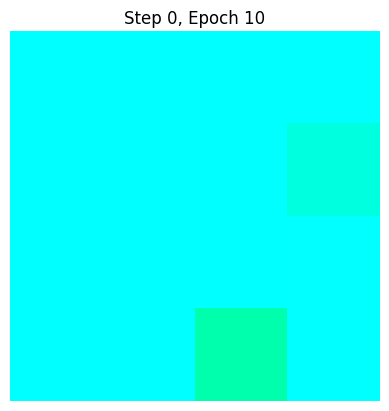

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.632682..5.1156335].


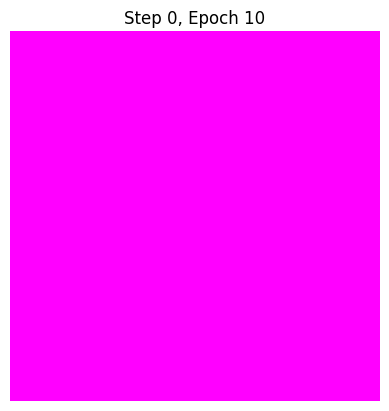

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.6752367..3.3586965].


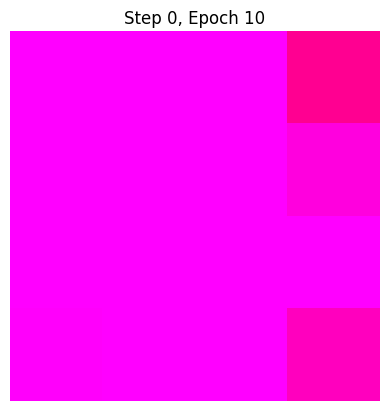

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.051201..6.267115].


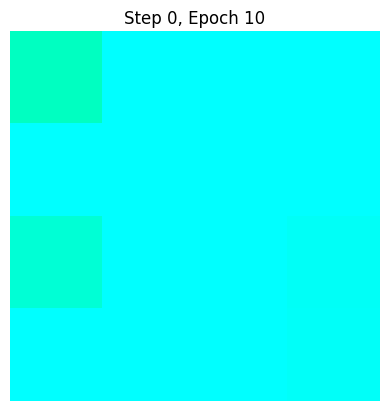

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.0312867..2.3365927].


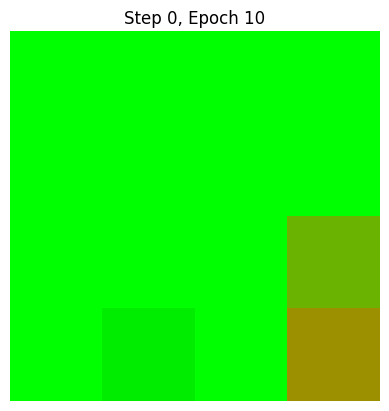

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.57784..2.6353986].


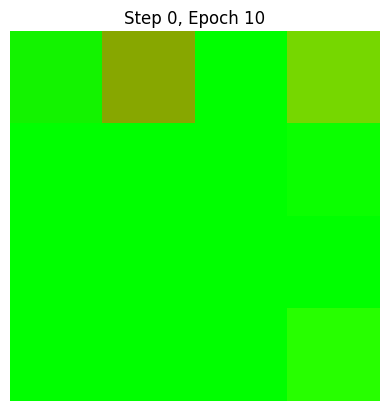

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.2911437..4.8241315].


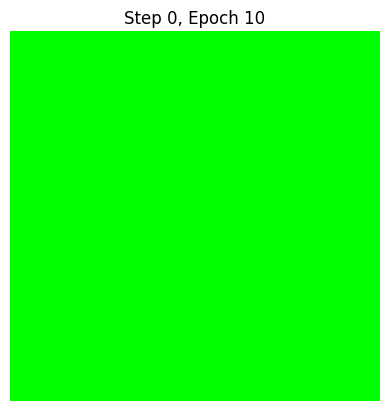

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1321554..2.130488].


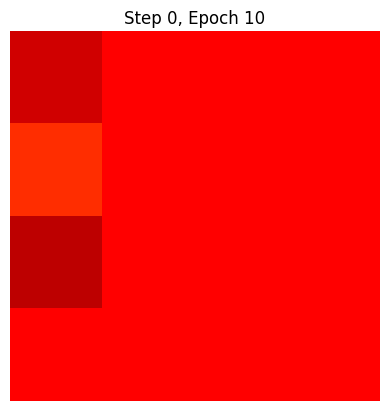

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.437771..3.2527242].


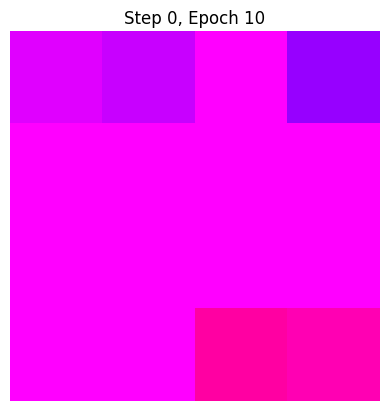

Epoch [11/40]


100%|██████████| 40/40 [00:51<00:00,  1.30s/it, gp=0.641, loss_critic=-17.2]


Epoch [12/40]


100%|██████████| 40/40 [00:52<00:00,  1.31s/it, gp=0.536, loss_critic=-13.8]


Epoch [13/40]


100%|██████████| 40/40 [00:53<00:00,  1.33s/it, gp=0.406, loss_critic=-17.1]


Epoch [14/40]


100%|██████████| 40/40 [00:52<00:00,  1.31s/it, gp=0.888, loss_critic=-14.8]


Epoch [15/40]


100%|██████████| 40/40 [00:52<00:00,  1.32s/it, gp=0.263, loss_critic=-11.2]


Epoch [16/40]


100%|██████████| 40/40 [00:51<00:00,  1.28s/it, gp=0.311, loss_critic=-11]  


Epoch [17/40]


100%|██████████| 40/40 [00:50<00:00,  1.26s/it, gp=0.334, loss_critic=-16.6]


Epoch [18/40]


100%|██████████| 40/40 [00:52<00:00,  1.31s/it, gp=0.505, loss_critic=-18.6]


Epoch [19/40]


100%|██████████| 40/40 [00:51<00:00,  1.29s/it, gp=0.517, loss_critic=-11.7]


Epoch [20/40]


100%|██████████| 40/40 [00:50<00:00,  1.26s/it, gp=0.449, loss_critic=-17.8]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.083626..5.024735].


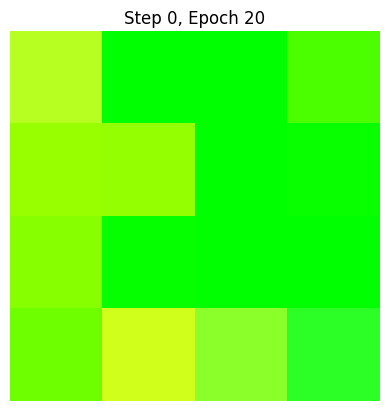

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6766858..2.1431665].


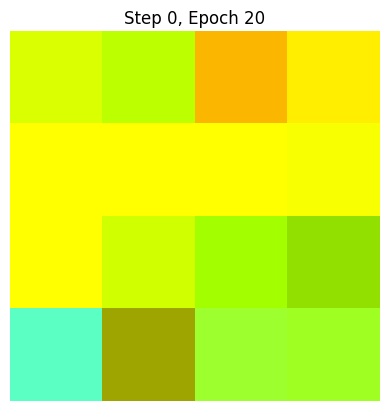

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.328653..4.2394476].


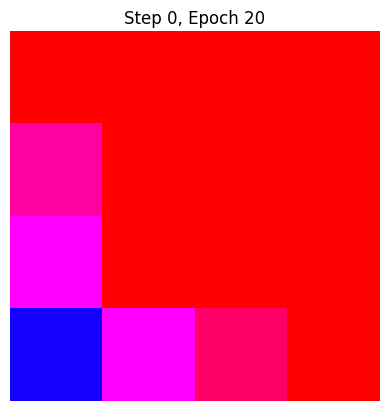

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.958893..4.456606].


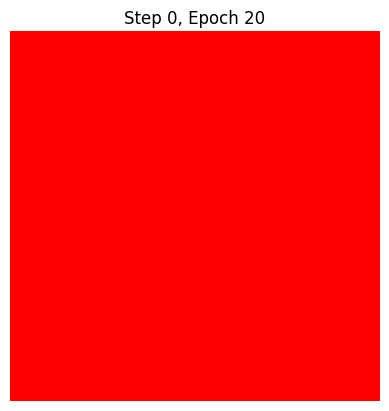

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.695064..2.4551945].


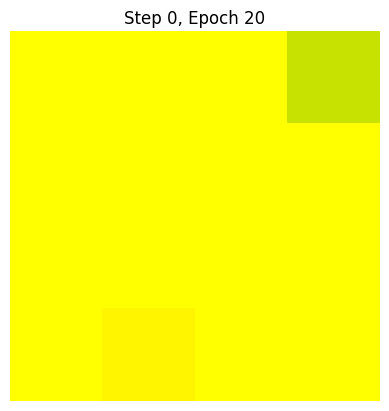

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4425881..4.4981623].


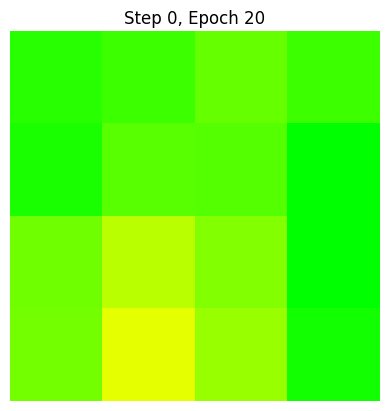

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.147737..4.4356565].


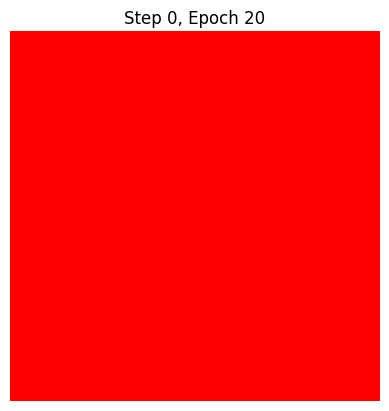

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.8709993..3.5780647].


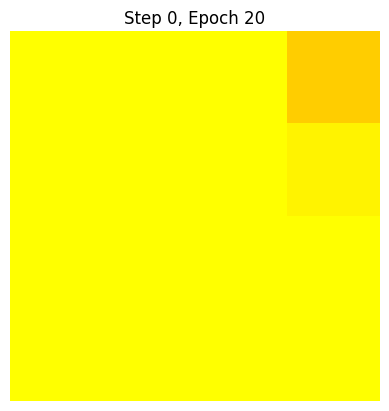

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9152448..4.444216].


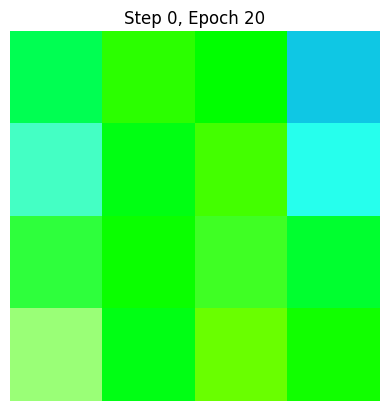

Epoch [21/40]


100%|██████████| 40/40 [00:51<00:00,  1.29s/it, gp=0.408, loss_critic=-20.1]


Epoch [22/40]


100%|██████████| 40/40 [00:52<00:00,  1.30s/it, gp=0.611, loss_critic=-22.2]


Epoch [23/40]


100%|██████████| 40/40 [00:52<00:00,  1.31s/it, gp=0.465, loss_critic=-16]  


Epoch [24/40]


100%|██████████| 40/40 [00:50<00:00,  1.27s/it, gp=0.408, loss_critic=-14.1]


Epoch [25/40]


100%|██████████| 40/40 [00:50<00:00,  1.27s/it, gp=0.275, loss_critic=-10.5]


Epoch [26/40]


100%|██████████| 40/40 [00:51<00:00,  1.29s/it, gp=0.307, loss_critic=-10.8]


Epoch [27/40]


100%|██████████| 40/40 [00:50<00:00,  1.27s/it, gp=0.287, loss_critic=-11.7]


Epoch [28/40]


100%|██████████| 40/40 [00:53<00:00,  1.34s/it, gp=0.255, loss_critic=-9.3] 


Epoch [29/40]


100%|██████████| 40/40 [00:52<00:00,  1.32s/it, gp=0.247, loss_critic=-11.2]


Epoch [30/40]


100%|██████████| 40/40 [00:51<00:00,  1.28s/it, gp=0.252, loss_critic=-10]  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.048667..1.7241366].


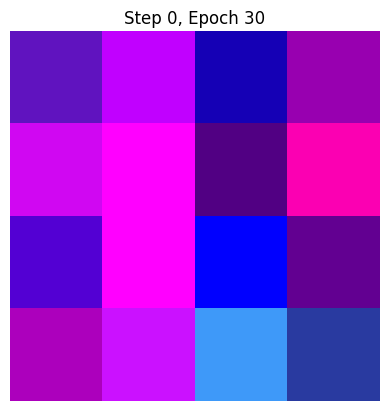

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.4450228..3.9461064].


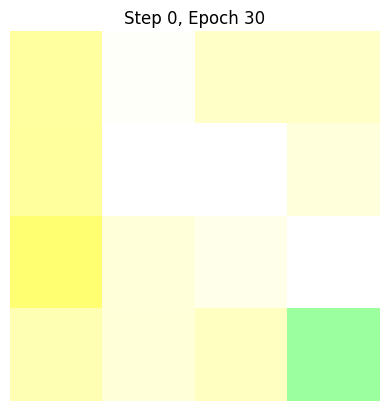

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.67733335..1.5402837].


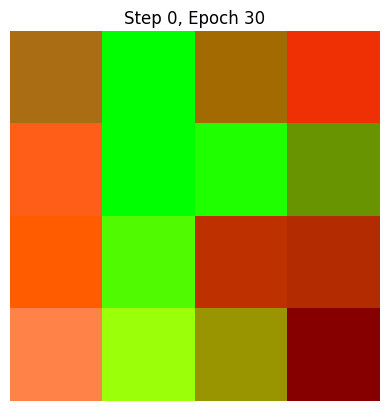

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5512438..6.548335].


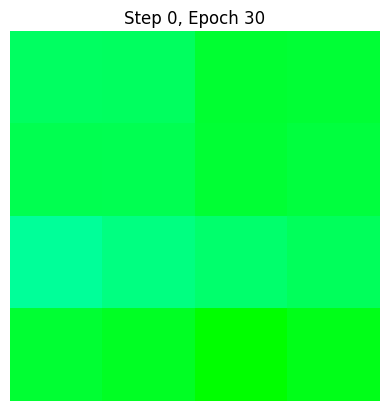

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.2423481..6.0529876].


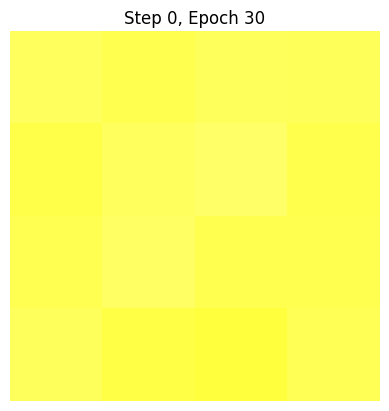

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16434965..3.5152552].


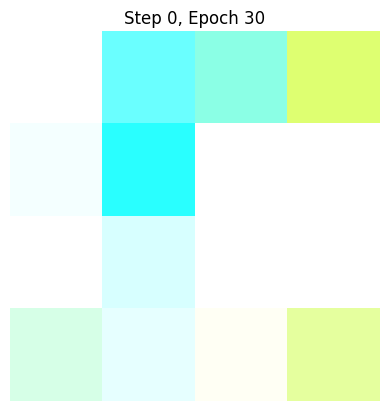

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.051672..1.6931101].


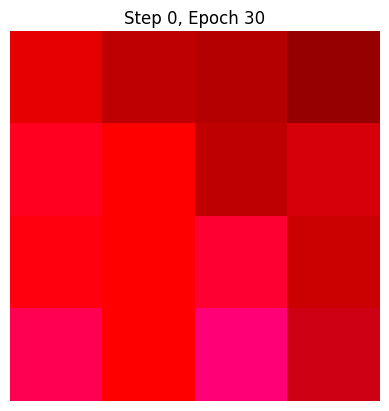

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7670248..0.9223324].


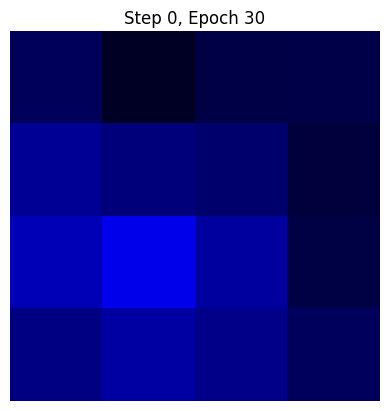

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6642442..7.3974814].


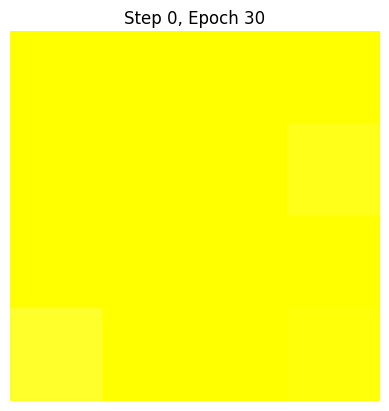

Epoch [31/40]


100%|██████████| 40/40 [00:52<00:00,  1.30s/it, gp=0.254, loss_critic=-7.35]


Epoch [32/40]


100%|██████████| 40/40 [00:51<00:00,  1.28s/it, gp=0.142, loss_critic=-7.61]


Epoch [33/40]


100%|██████████| 40/40 [00:51<00:00,  1.30s/it, gp=0.151, loss_critic=-7.85]


Epoch [34/40]


100%|██████████| 40/40 [00:49<00:00,  1.25s/it, gp=0.176, loss_critic=-8.57] 


Epoch [35/40]


100%|██████████| 40/40 [00:50<00:00,  1.27s/it, gp=0.0777, loss_critic=-4.85]


Epoch [36/40]


100%|██████████| 40/40 [00:50<00:00,  1.26s/it, gp=0.0974, loss_critic=-5.36]


Epoch [37/40]


100%|██████████| 40/40 [00:51<00:00,  1.29s/it, gp=0.0868, loss_critic=-4.61]


Epoch [38/40]


100%|██████████| 40/40 [00:50<00:00,  1.27s/it, gp=0.0697, loss_critic=-5.94]


Epoch [39/40]


100%|██████████| 40/40 [00:51<00:00,  1.29s/it, gp=0.0902, loss_critic=-4.8] 


Epoch [40/40]


100%|██████████| 40/40 [00:51<00:00,  1.29s/it, gp=0.084, loss_critic=-7]    
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.37969577..2.5075874].


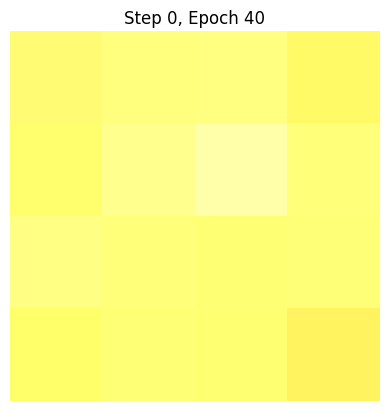

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8304194..1.3350189].


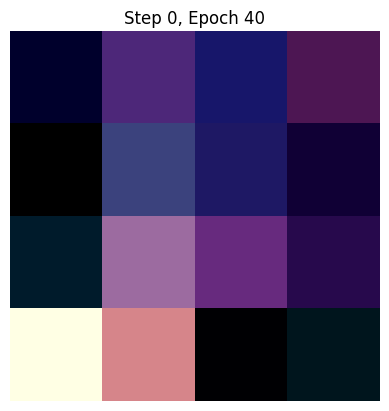

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7217994..1.0862772].


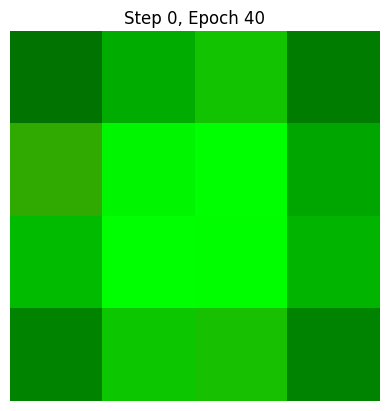

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.3954873..-0.071106255].


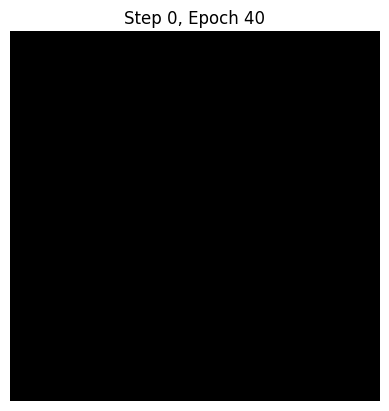

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.112521..0.9668315].


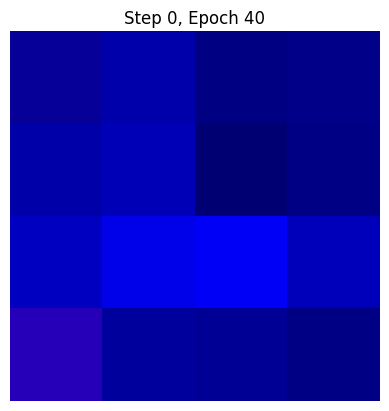

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4210025..2.1215227].


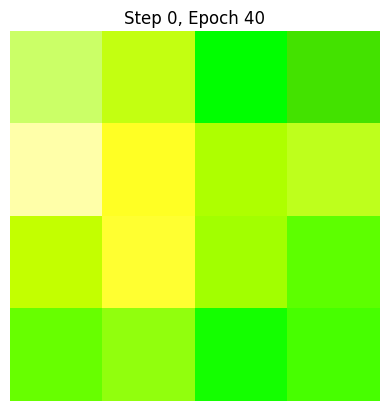

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8766899..0.8914913].


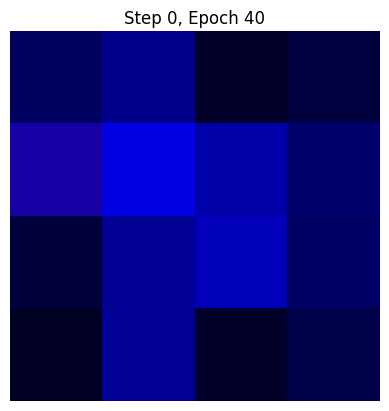

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.802125..-0.35649288].


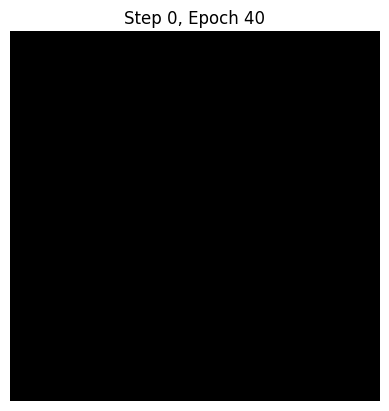

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.791889..-0.30162907].


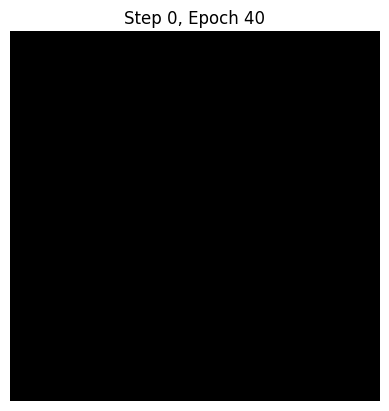

Step 0 
Current image size: 8
Epoch [1/40]


100%|██████████| 40/40 [00:56<00:00,  1.41s/it, gp=0.0422, loss_critic=-3.81]


Epoch [2/40]


100%|██████████| 40/40 [00:55<00:00,  1.39s/it, gp=0.0543, loss_critic=-2.9] 


Epoch [3/40]


100%|██████████| 40/40 [00:56<00:00,  1.41s/it, gp=0.0309, loss_critic=-2.4] 


Epoch [4/40]


100%|██████████| 40/40 [00:57<00:00,  1.43s/it, gp=0.0538, loss_critic=-2.15]


Epoch [5/40]


100%|██████████| 40/40 [00:56<00:00,  1.42s/it, gp=0.0578, loss_critic=-2.97]


Epoch [6/40]


100%|██████████| 40/40 [00:56<00:00,  1.42s/it, gp=0.00578, loss_critic=-2.1]


Epoch [7/40]


100%|██████████| 40/40 [00:55<00:00,  1.40s/it, gp=0.0326, loss_critic=-3.53]


Epoch [8/40]


100%|██████████| 40/40 [00:57<00:00,  1.43s/it, gp=0.106, loss_critic=-2.69] 


Epoch [9/40]


100%|██████████| 40/40 [00:57<00:00,  1.43s/it, gp=0.0444, loss_critic=-3.04]


Epoch [10/40]


100%|██████████| 40/40 [00:56<00:00,  1.41s/it, gp=0.0619, loss_critic=-3.72] 


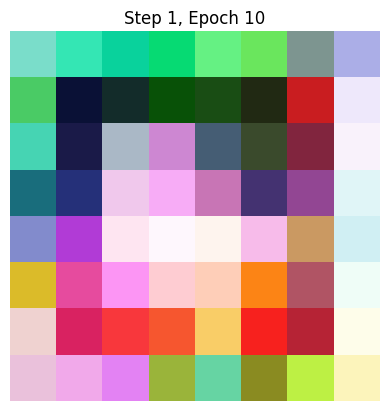

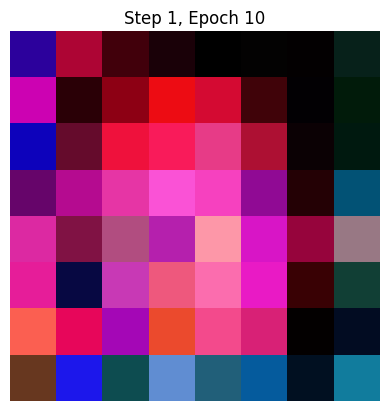

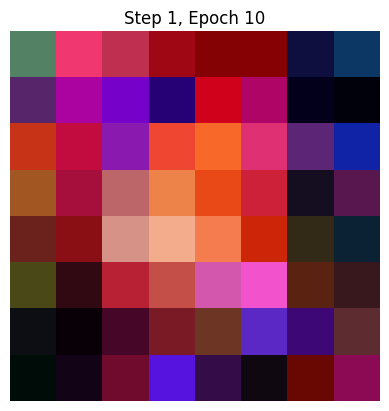

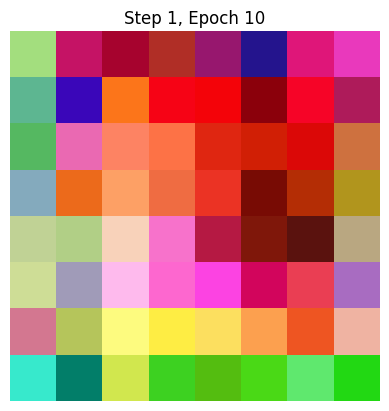

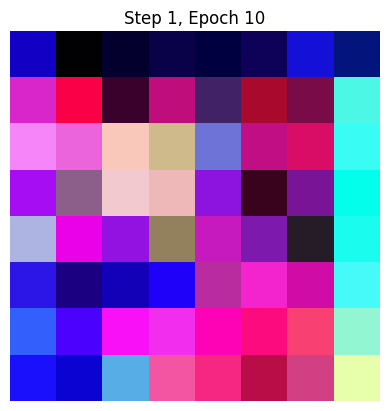

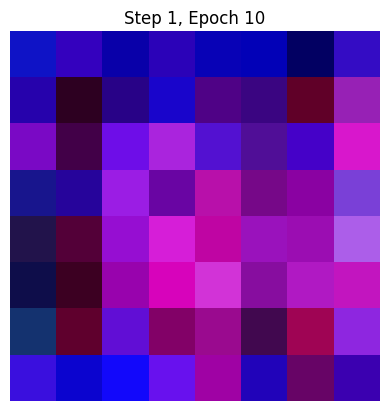

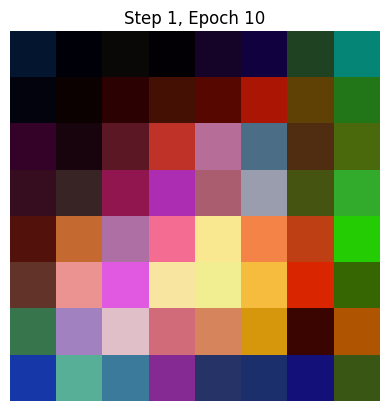

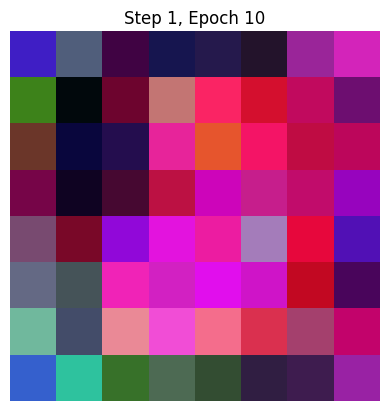

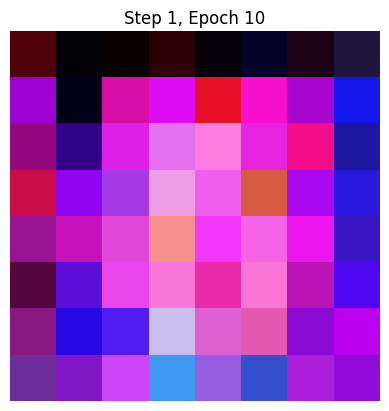

Epoch [11/40]


100%|██████████| 40/40 [00:56<00:00,  1.42s/it, gp=0.0269, loss_critic=-3.64]


Epoch [12/40]


100%|██████████| 40/40 [00:55<00:00,  1.40s/it, gp=0.0353, loss_critic=-3.2] 


Epoch [13/40]


100%|██████████| 40/40 [00:55<00:00,  1.40s/it, gp=0.0392, loss_critic=-3]   


Epoch [14/40]


100%|██████████| 40/40 [00:55<00:00,  1.38s/it, gp=0.135, loss_critic=-2.89]  


Epoch [15/40]


100%|██████████| 40/40 [00:55<00:00,  1.39s/it, gp=0.0309, loss_critic=-3.47]


Epoch [16/40]


100%|██████████| 40/40 [00:54<00:00,  1.37s/it, gp=0.042, loss_critic=-3.56] 


Epoch [17/40]


100%|██████████| 40/40 [00:55<00:00,  1.38s/it, gp=0.024, loss_critic=-3.36] 


Epoch [18/40]


100%|██████████| 40/40 [00:56<00:00,  1.41s/it, gp=0.0596, loss_critic=-3.54]


Epoch [19/40]


100%|██████████| 40/40 [00:56<00:00,  1.42s/it, gp=0.048, loss_critic=-3.21]  


Epoch [20/40]


100%|██████████| 40/40 [00:54<00:00,  1.36s/it, gp=0.0727, loss_critic=-3.88] 


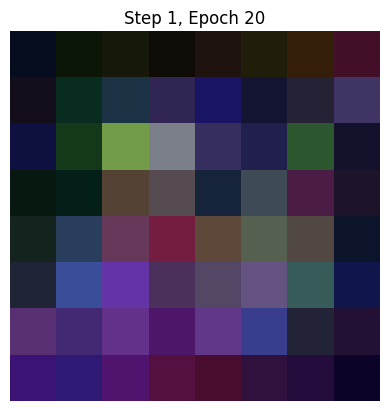

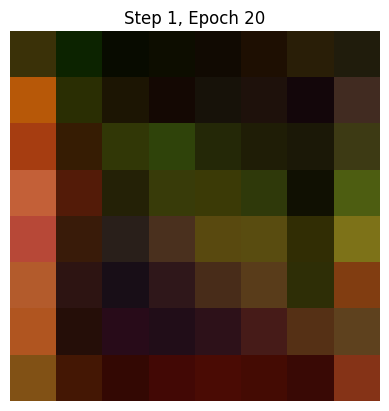

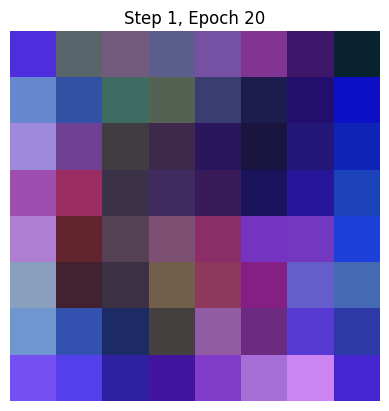

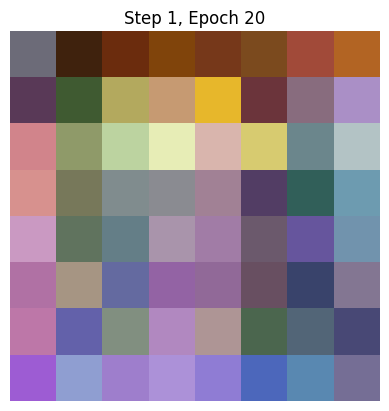

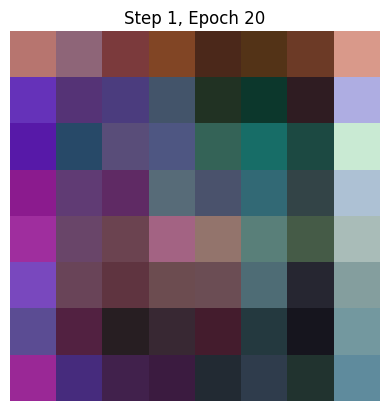

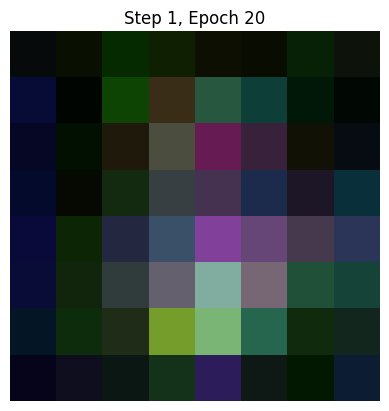

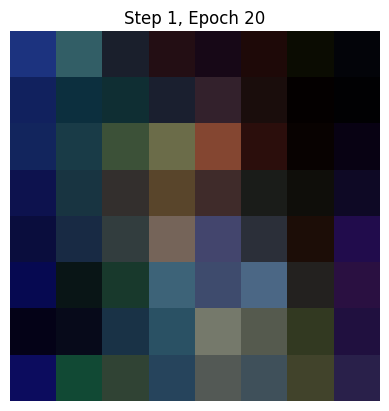

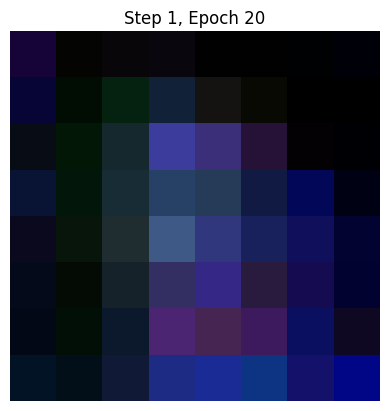

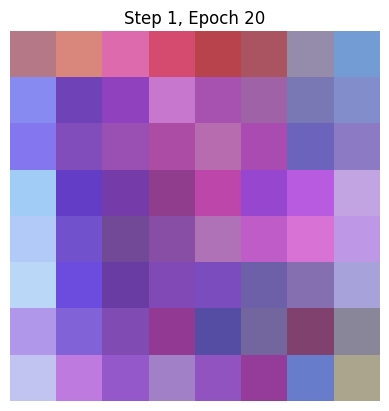

Epoch [21/40]


100%|██████████| 40/40 [00:54<00:00,  1.37s/it, gp=0.0405, loss_critic=-2.87]


Epoch [22/40]


100%|██████████| 40/40 [00:54<00:00,  1.36s/it, gp=0.0302, loss_critic=-3.3] 


Epoch [23/40]


100%|██████████| 40/40 [00:54<00:00,  1.36s/it, gp=0.0277, loss_critic=-3.26]


Epoch [24/40]


100%|██████████| 40/40 [00:54<00:00,  1.37s/it, gp=0.0269, loss_critic=-2.94]


Epoch [25/40]


100%|██████████| 40/40 [00:55<00:00,  1.40s/it, gp=0.0222, loss_critic=-2.64]


Epoch [26/40]


100%|██████████| 40/40 [00:54<00:00,  1.36s/it, gp=0.0333, loss_critic=-3.13]


Epoch [27/40]


100%|██████████| 40/40 [00:54<00:00,  1.37s/it, gp=0.0229, loss_critic=-2.81]


Epoch [28/40]


100%|██████████| 40/40 [00:55<00:00,  1.39s/it, gp=0.0364, loss_critic=-2.64] 


Epoch [29/40]


100%|██████████| 40/40 [00:55<00:00,  1.38s/it, gp=0.024, loss_critic=-2.34] 


Epoch [30/40]


100%|██████████| 40/40 [00:55<00:00,  1.40s/it, gp=0.0636, loss_critic=-2.65]


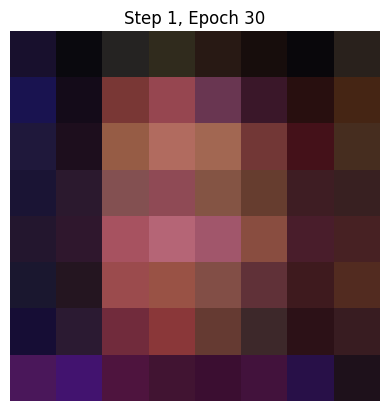

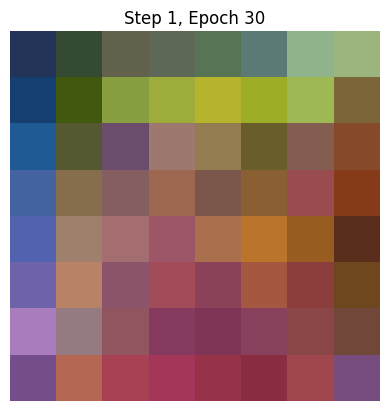

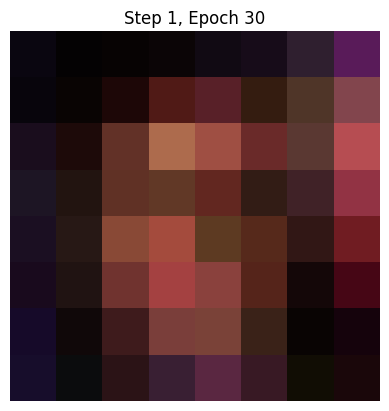

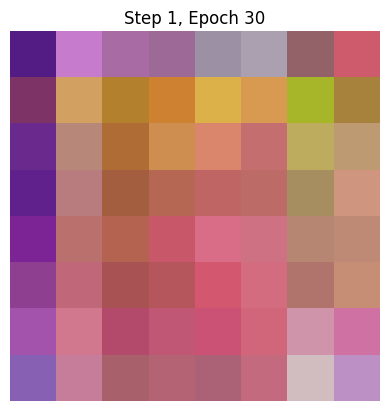

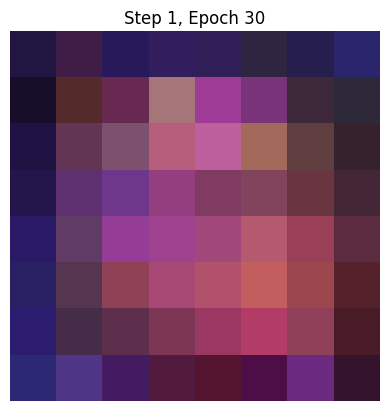

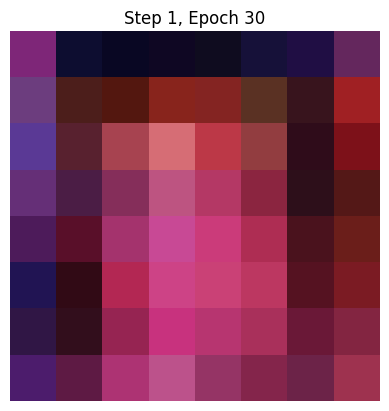

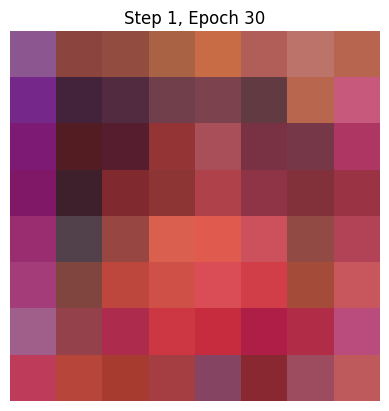

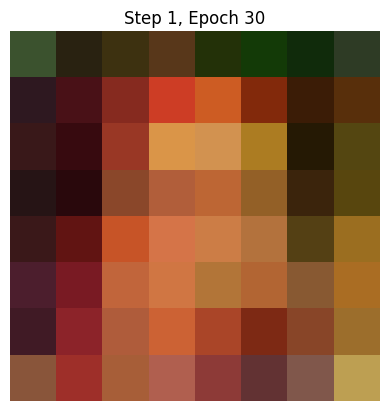

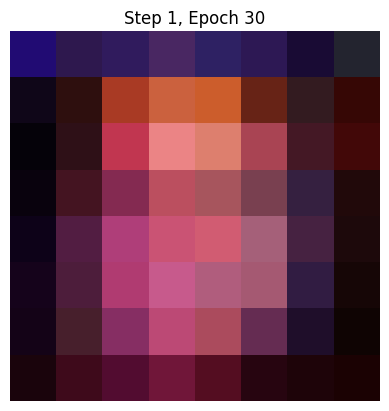

Epoch [31/40]


100%|██████████| 40/40 [00:55<00:00,  1.40s/it, gp=0.0319, loss_critic=-2.48]


Epoch [32/40]


100%|██████████| 40/40 [00:55<00:00,  1.40s/it, gp=0.0529, loss_critic=-2.5]  


Epoch [33/40]


100%|██████████| 40/40 [00:55<00:00,  1.39s/it, gp=0.0358, loss_critic=-3.38]


Epoch [34/40]


100%|██████████| 40/40 [00:56<00:00,  1.41s/it, gp=0.0184, loss_critic=-1.47]


Epoch [35/40]


100%|██████████| 40/40 [00:55<00:00,  1.40s/it, gp=0.0244, loss_critic=-1.9] 


Epoch [36/40]


100%|██████████| 40/40 [00:54<00:00,  1.37s/it, gp=0.00635, loss_critic=-1.66]


Epoch [37/40]


100%|██████████| 40/40 [00:55<00:00,  1.39s/it, gp=0.0448, loss_critic=-1.99] 


Epoch [38/40]


100%|██████████| 40/40 [00:55<00:00,  1.39s/it, gp=0.0194, loss_critic=-1.96] 


Epoch [39/40]


100%|██████████| 40/40 [00:54<00:00,  1.36s/it, gp=0.0232, loss_critic=-2.93] 


Epoch [40/40]


100%|██████████| 40/40 [00:54<00:00,  1.35s/it, gp=0.041, loss_critic=-2.28]  


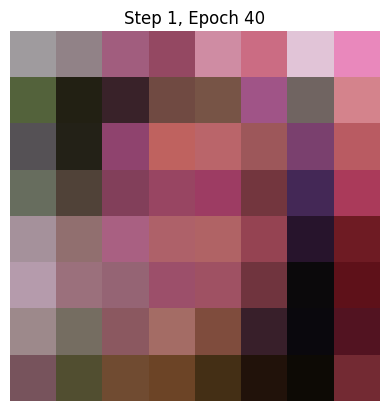

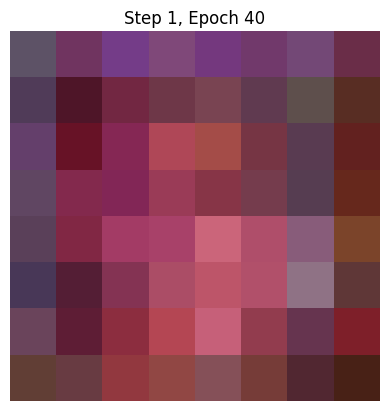

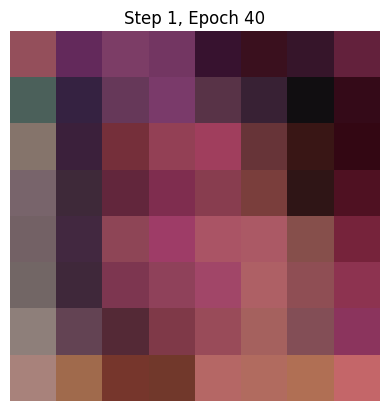

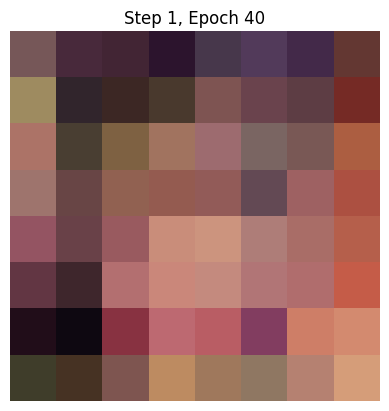

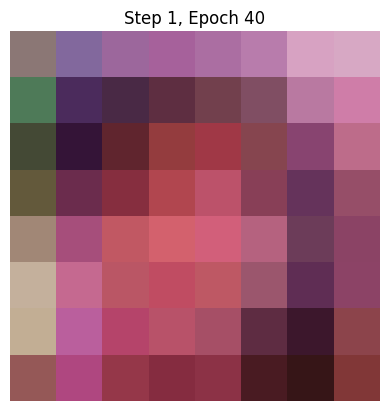

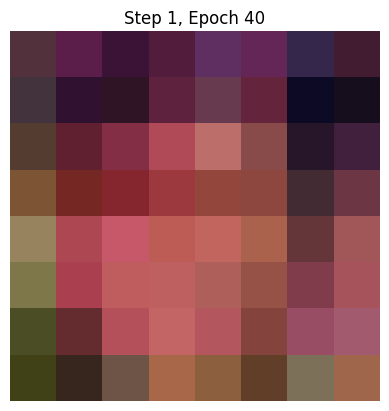

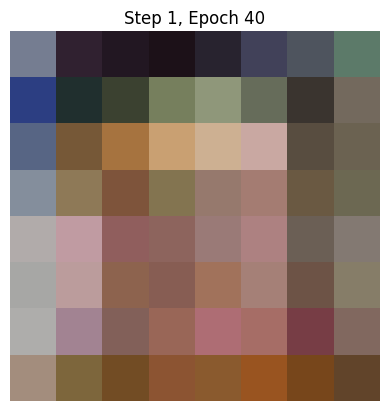

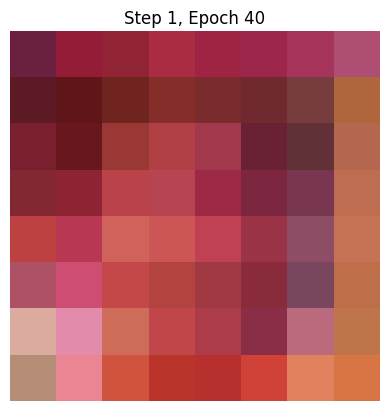

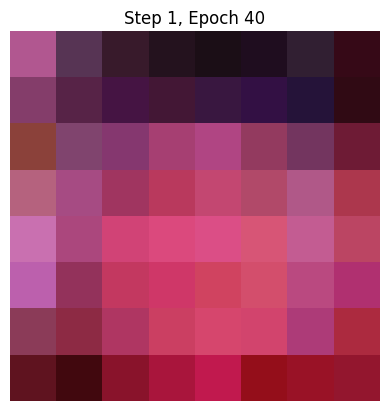

Step 1 
Current image size: 16
Epoch [1/40]


100%|██████████| 79/79 [01:15<00:00,  1.04it/s, gp=0.0773, loss_critic=-3.51]


Epoch [2/40]


100%|██████████| 79/79 [01:16<00:00,  1.04it/s, gp=0.0391, loss_critic=-2.33]


Epoch [3/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0676, loss_critic=-3.54]


Epoch [4/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.05, loss_critic=-2.71]  


Epoch [5/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0688, loss_critic=-3.08]


Epoch [6/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0312, loss_critic=-3.13]


Epoch [7/40]


100%|██████████| 79/79 [01:17<00:00,  1.03it/s, gp=0.0769, loss_critic=-3.44]


Epoch [8/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0515, loss_critic=-3.18]


Epoch [9/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0235, loss_critic=-3.51]


Epoch [10/40]


100%|██████████| 79/79 [01:17<00:00,  1.01it/s, gp=0.0352, loss_critic=-1.81]


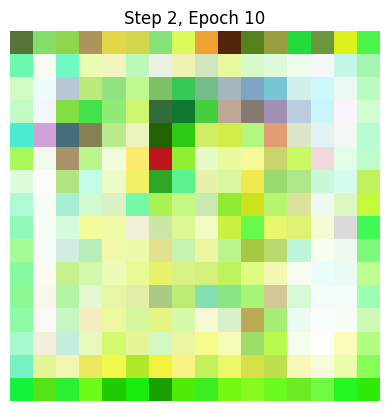

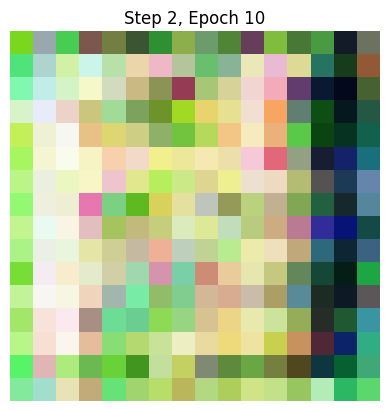

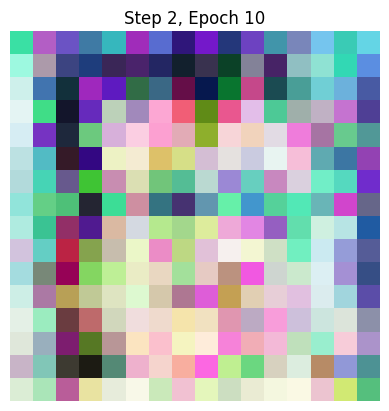

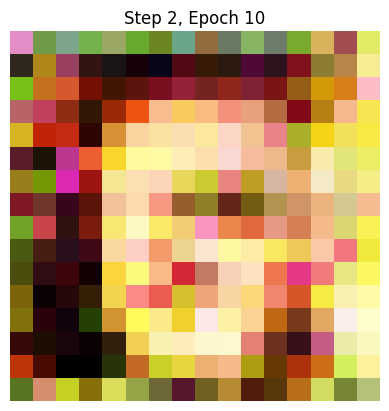

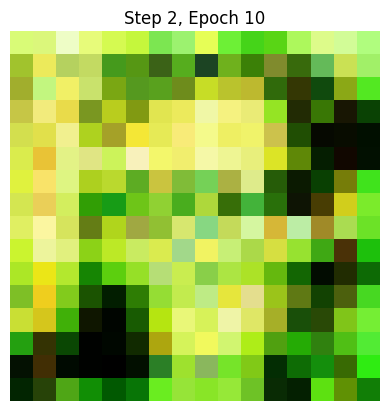

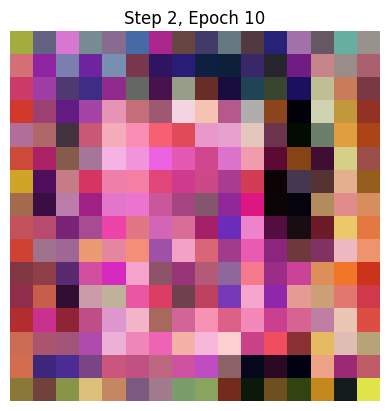

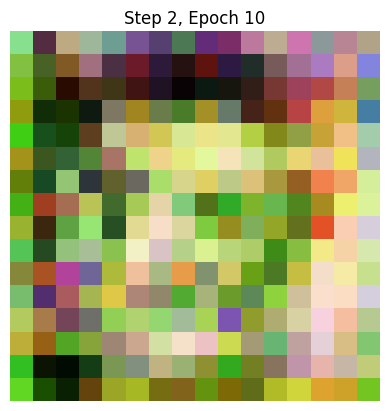

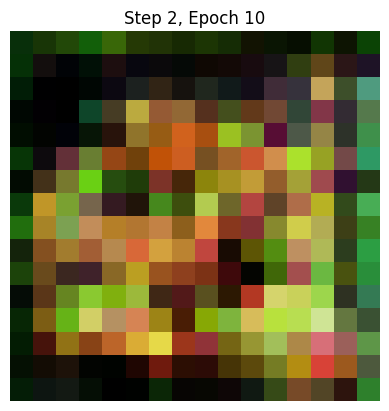

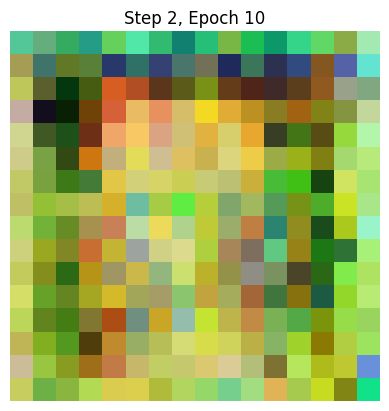

Epoch [11/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.119, loss_critic=-4.77] 


Epoch [12/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.019, loss_critic=-4.43] 


Epoch [13/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0125, loss_critic=-2.79]


Epoch [14/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0862, loss_critic=-4.59] 


Epoch [15/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0368, loss_critic=-3.51]


Epoch [16/40]


100%|██████████| 79/79 [01:16<00:00,  1.04it/s, gp=0.0464, loss_critic=-3.68]


Epoch [17/40]


100%|██████████| 79/79 [01:15<00:00,  1.04it/s, gp=0.0373, loss_critic=-3.94]


Epoch [18/40]


100%|██████████| 79/79 [01:16<00:00,  1.04it/s, gp=0.0445, loss_critic=-2.6] 


Epoch [19/40]


100%|██████████| 79/79 [01:16<00:00,  1.04it/s, gp=0.0288, loss_critic=-3.57]


Epoch [20/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0366, loss_critic=-2.97]


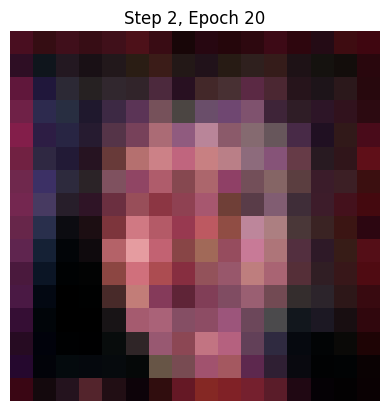

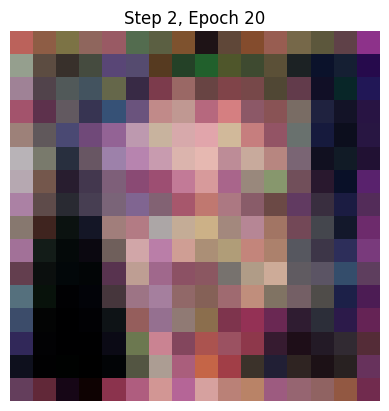

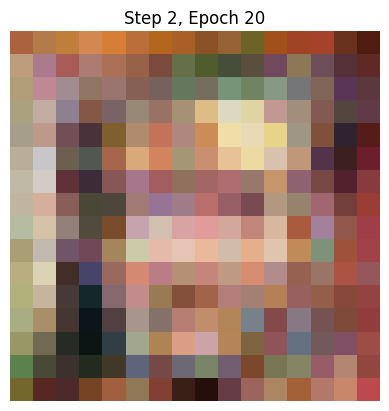

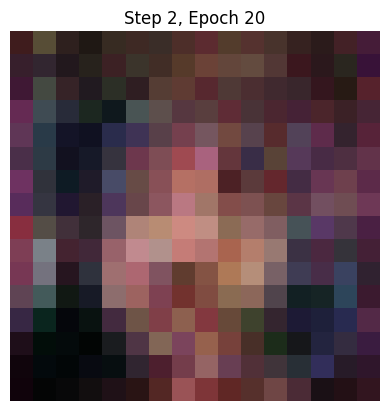

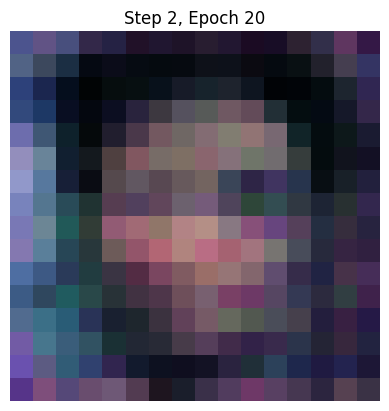

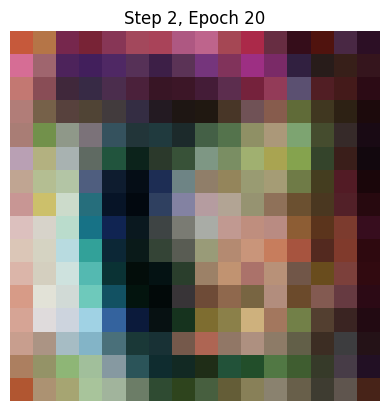

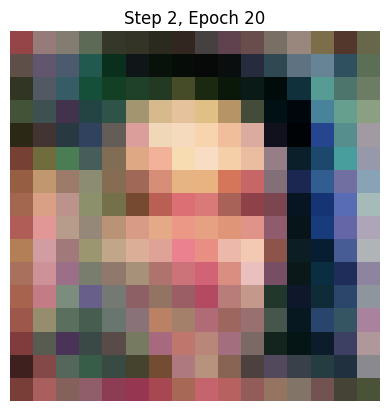

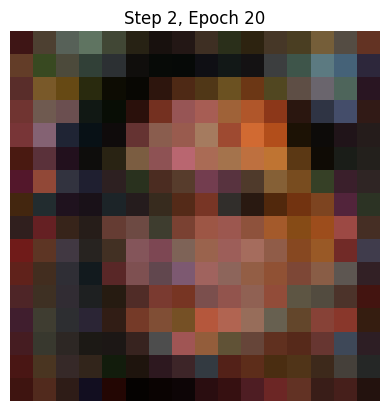

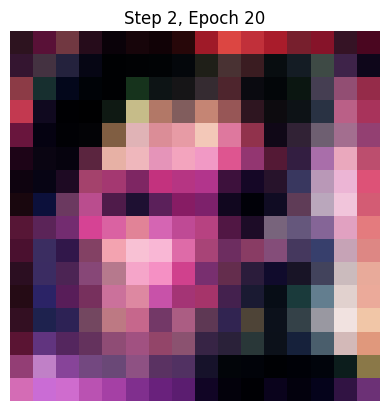

Epoch [21/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0721, loss_critic=-2.94]


Epoch [22/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0299, loss_critic=-2.86]


Epoch [23/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0506, loss_critic=-2.56]


Epoch [24/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0361, loss_critic=-2.57]


Epoch [25/40]


100%|██████████| 79/79 [01:16<00:00,  1.04it/s, gp=0.0562, loss_critic=-2.53]


Epoch [26/40]


100%|██████████| 79/79 [01:18<00:00,  1.00it/s, gp=0.0116, loss_critic=-2.74] 


Epoch [27/40]


100%|██████████| 79/79 [01:21<00:00,  1.04s/it, gp=0.011, loss_critic=-2.44] 


Epoch [28/40]


100%|██████████| 79/79 [01:20<00:00,  1.02s/it, gp=0.017, loss_critic=-1.93]  


Epoch [29/40]


100%|██████████| 79/79 [01:20<00:00,  1.02s/it, gp=0.014, loss_critic=-2.37]  


Epoch [30/40]


100%|██████████| 79/79 [01:18<00:00,  1.01it/s, gp=0.0326, loss_critic=-2.26] 


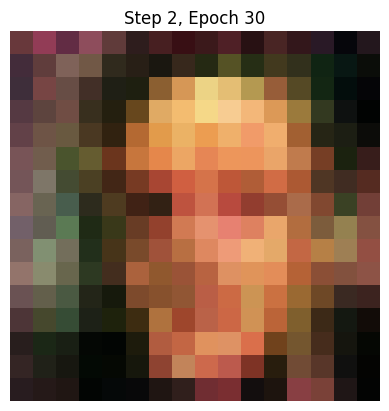

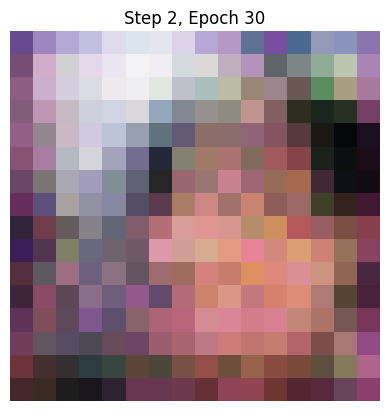

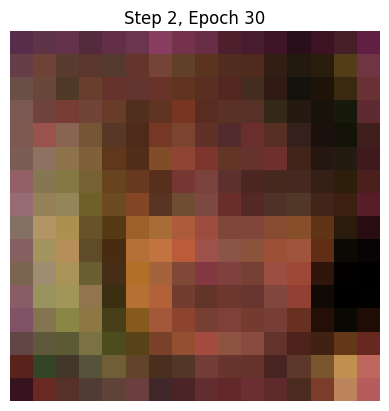

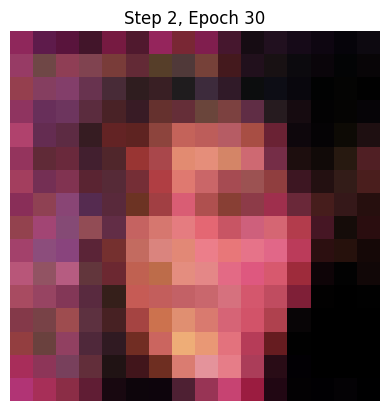

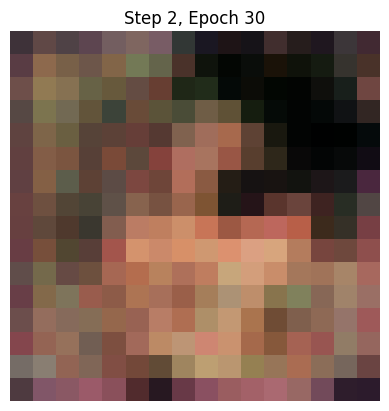

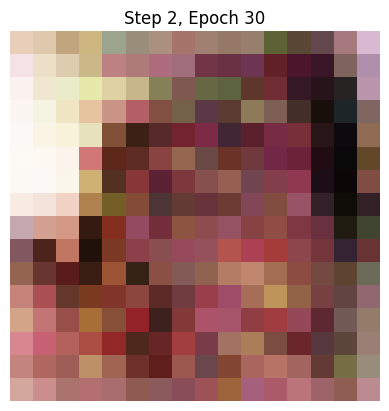

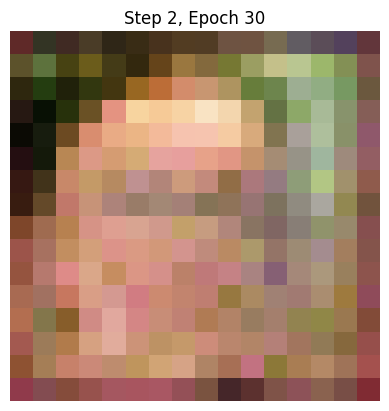

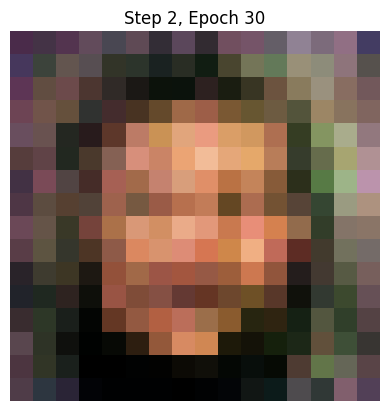

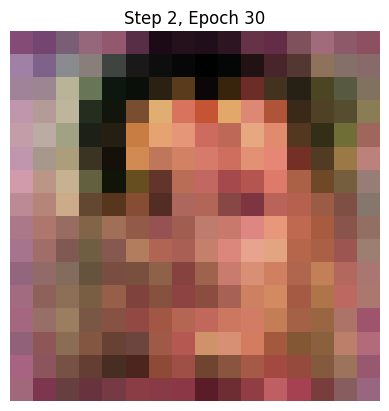

Epoch [31/40]


100%|██████████| 79/79 [01:15<00:00,  1.04it/s, gp=0.0163, loss_critic=-2.04] 


Epoch [32/40]


100%|██████████| 79/79 [01:16<00:00,  1.04it/s, gp=0.0264, loss_critic=-2.41] 


Epoch [33/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0294, loss_critic=-1.47] 


Epoch [34/40]


100%|██████████| 79/79 [01:17<00:00,  1.02it/s, gp=0.00678, loss_critic=-1.31]


Epoch [35/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0113, loss_critic=-1.59] 


Epoch [36/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0149, loss_critic=-1]    


Epoch [37/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.0232, loss_critic=-2.21] 


Epoch [38/40]


100%|██████████| 79/79 [01:17<00:00,  1.02it/s, gp=0.00821, loss_critic=-1.31]


Epoch [39/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.00957, loss_critic=-1.25]


Epoch [40/40]


100%|██████████| 79/79 [01:16<00:00,  1.03it/s, gp=0.00911, loss_critic=-1.73]


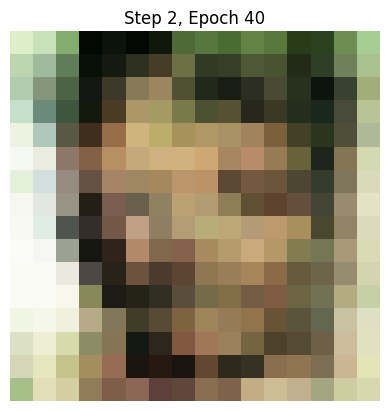

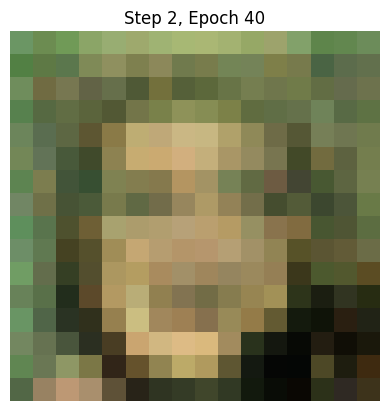

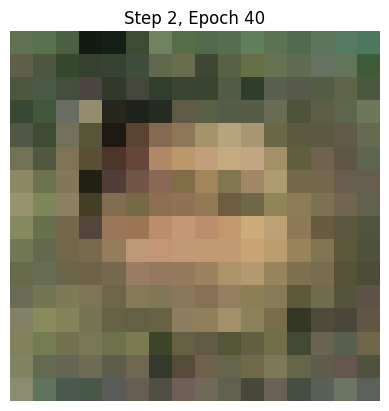

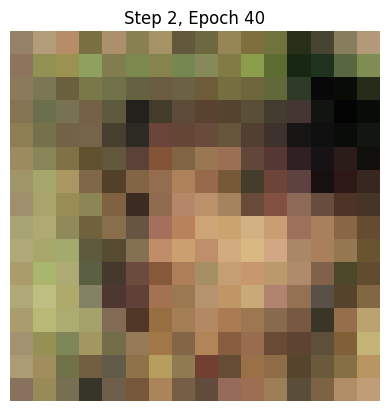

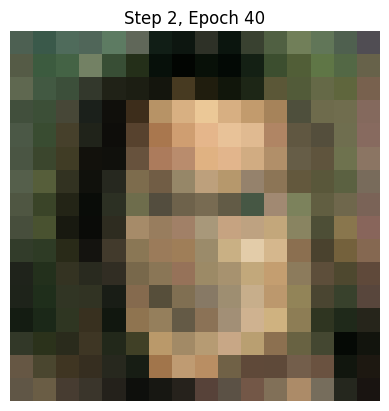

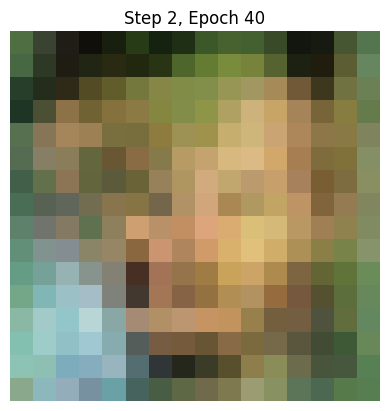

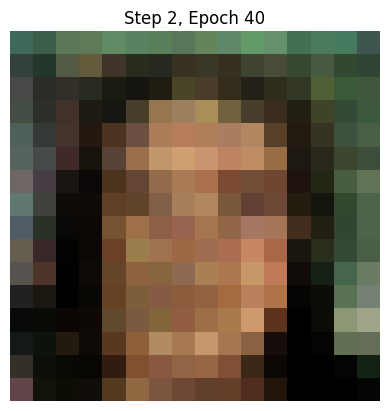

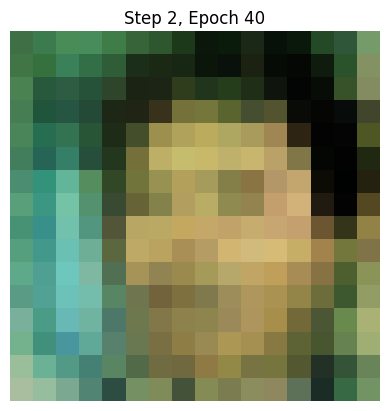

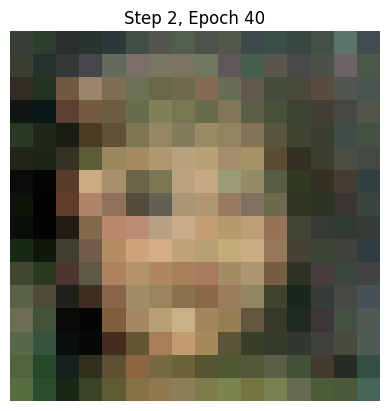

Step 2 
Current image size: 32
Epoch [1/40]


100%|██████████| 157/157 [02:05<00:00,  1.26it/s, gp=0.00957, loss_critic=-3.05]


Epoch [2/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0259, loss_critic=-2.67] 


Epoch [3/40]


100%|██████████| 157/157 [02:05<00:00,  1.25it/s, gp=0.0778, loss_critic=-2.44]


Epoch [4/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.00343, loss_critic=-2.3] 


Epoch [5/40]


100%|██████████| 157/157 [02:09<00:00,  1.21it/s, gp=0.118, loss_critic=-4.12]  


Epoch [6/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0309, loss_critic=-2.24] 


Epoch [7/40]


100%|██████████| 157/157 [02:05<00:00,  1.25it/s, gp=0.0599, loss_critic=-3.36] 


Epoch [8/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0247, loss_critic=-4.12] 


Epoch [9/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0285, loss_critic=-2.57] 


Epoch [10/40]


100%|██████████| 157/157 [02:05<00:00,  1.25it/s, gp=0.0189, loss_critic=-1.17] 


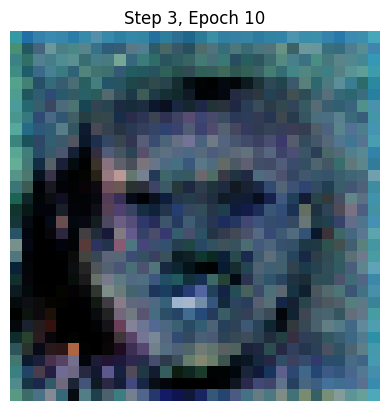

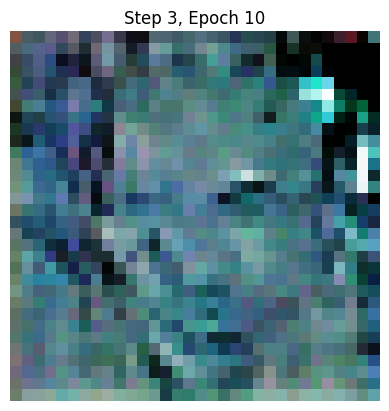

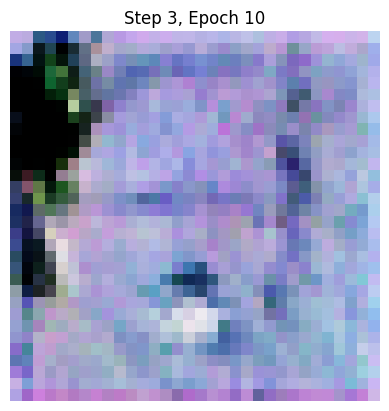

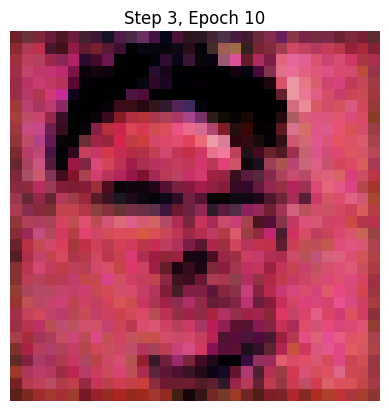

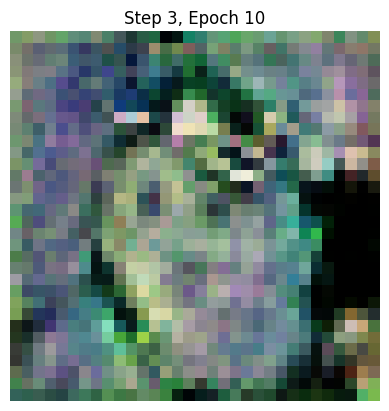

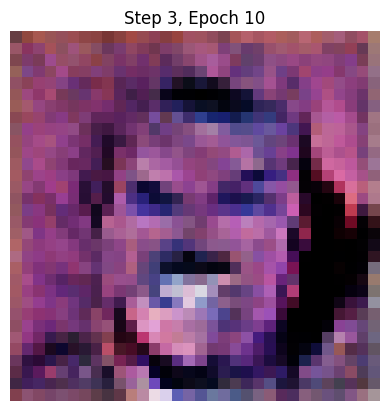

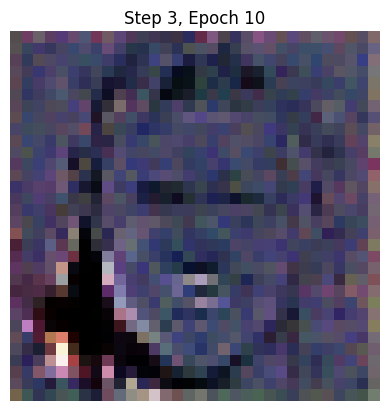

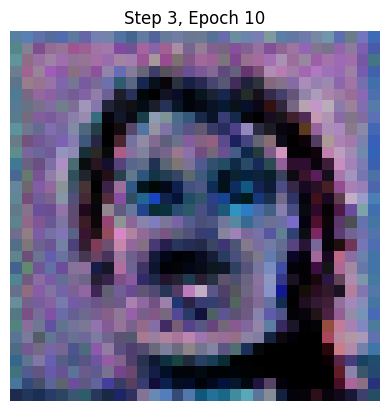

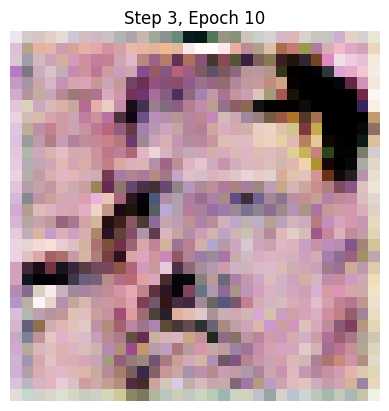

Epoch [11/40]


100%|██████████| 157/157 [02:09<00:00,  1.21it/s, gp=0.0128, loss_critic=-2.71] 


Epoch [12/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0704, loss_critic=-2.42] 


Epoch [13/40]


100%|██████████| 157/157 [02:07<00:00,  1.23it/s, gp=0.00967, loss_critic=-2.14]


Epoch [14/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0051, loss_critic=-1.6]  


Epoch [15/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0191, loss_critic=-2.42] 


Epoch [16/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0232, loss_critic=-1.87] 


Epoch [17/40]


100%|██████████| 157/157 [02:07<00:00,  1.23it/s, gp=0.0134, loss_critic=-2.58]


Epoch [18/40]


100%|██████████| 157/157 [02:05<00:00,  1.25it/s, gp=0.0149, loss_critic=-1.82] 


Epoch [19/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0268, loss_critic=-2.8]  


Epoch [20/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0557, loss_critic=-1.37] 


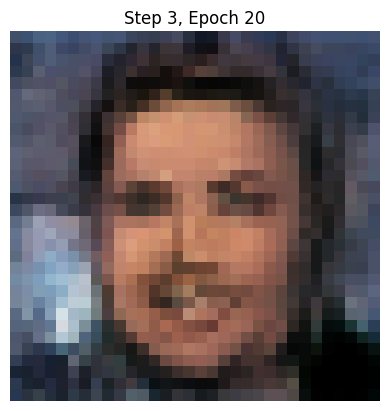

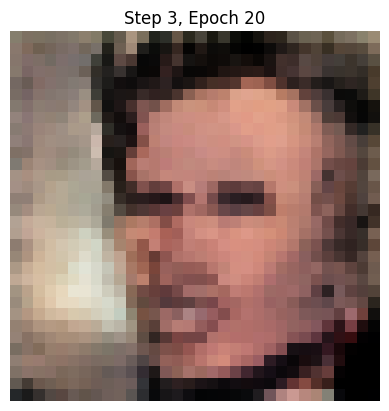

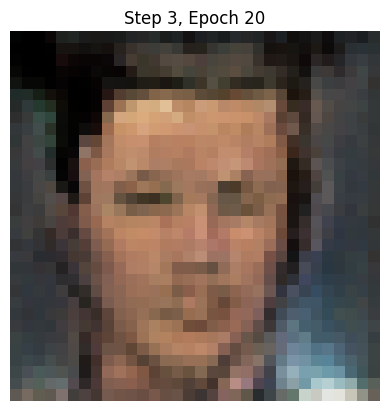

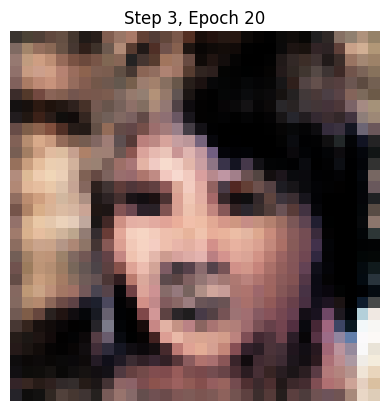

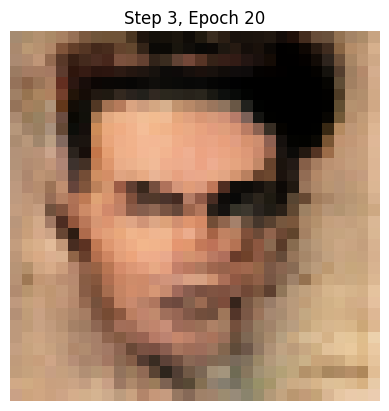

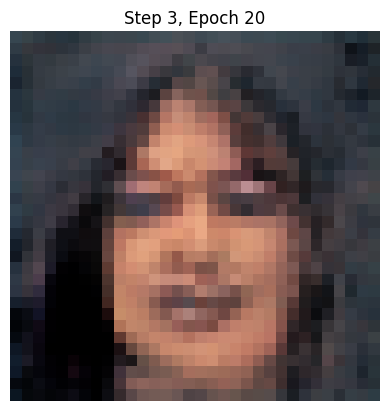

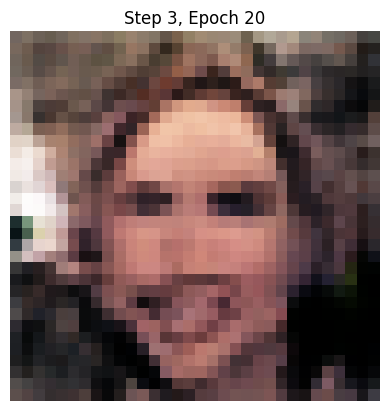

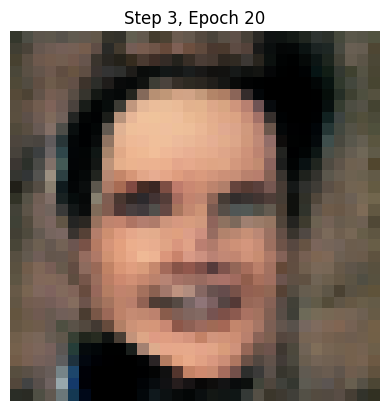

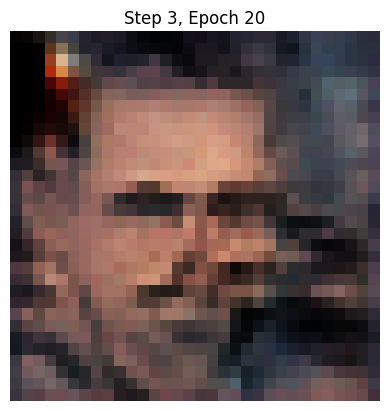

Epoch [21/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0223, loss_critic=-1.26] 


Epoch [22/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0185, loss_critic=-1.81] 


Epoch [23/40]


100%|██████████| 157/157 [02:05<00:00,  1.25it/s, gp=0.0126, loss_critic=-2.39] 


Epoch [24/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0119, loss_critic=-1.77] 


Epoch [25/40]


100%|██████████| 157/157 [02:05<00:00,  1.25it/s, gp=0.0256, loss_critic=-1.58] 


Epoch [26/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.206, loss_critic=0.0676] 


Epoch [27/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.00364, loss_critic=-1.53]


Epoch [28/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0404, loss_critic=-1.19] 


Epoch [29/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.00753, loss_critic=-1.56]


Epoch [30/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0254, loss_critic=-.756] 


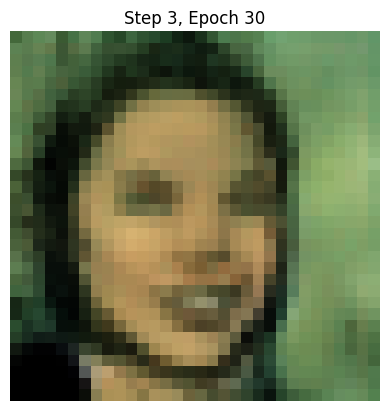

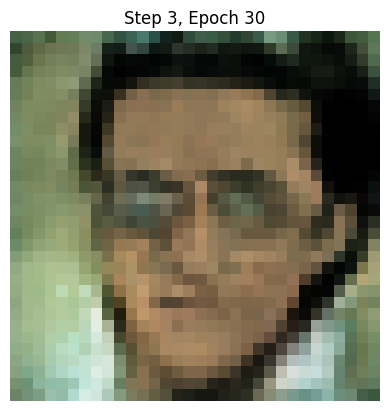

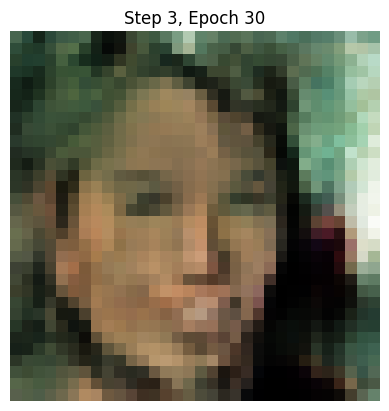

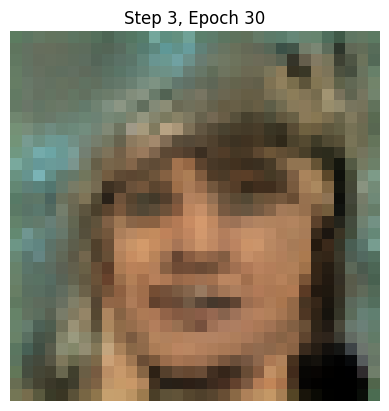

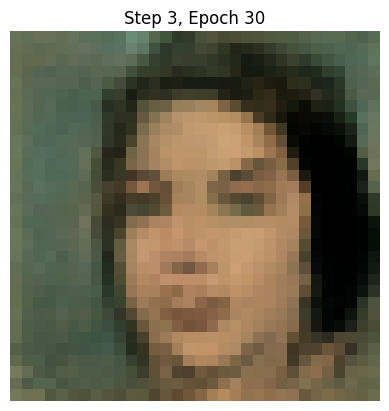

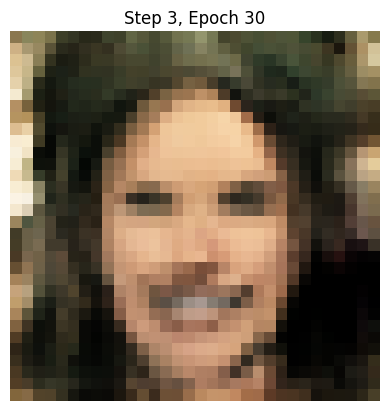

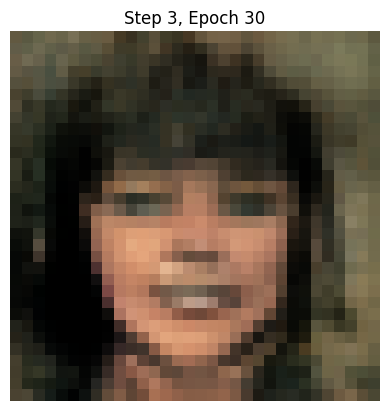

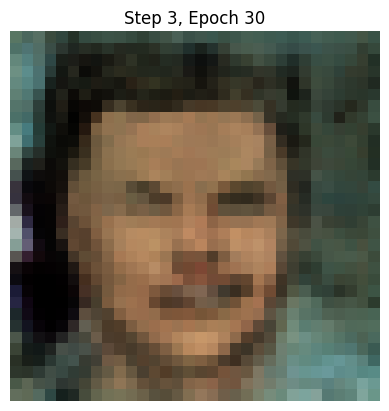

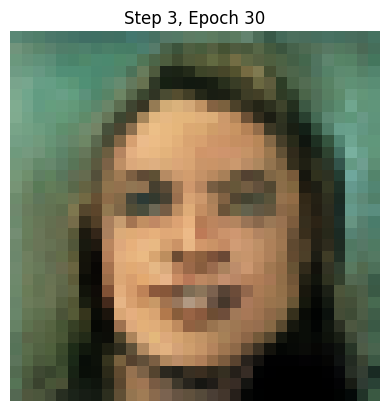

Epoch [31/40]


100%|██████████| 157/157 [02:05<00:00,  1.26it/s, gp=0.00721, loss_critic=-1.29]


Epoch [32/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.00871, loss_critic=-1.25]


Epoch [33/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.00776, loss_critic=-1.23]


Epoch [34/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.00609, loss_critic=-1.66]


Epoch [35/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.00327, loss_critic=-1.32]


Epoch [36/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0138, loss_critic=-1.29] 


Epoch [37/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0126, loss_critic=-1.21] 


Epoch [38/40]


100%|██████████| 157/157 [02:04<00:00,  1.26it/s, gp=0.0209, loss_critic=-.987] 


Epoch [39/40]


100%|██████████| 157/157 [02:05<00:00,  1.25it/s, gp=0.00997, loss_critic=-.843]


Epoch [40/40]


100%|██████████| 157/157 [02:13<00:00,  1.18it/s, gp=0.0217, loss_critic=-.908] 


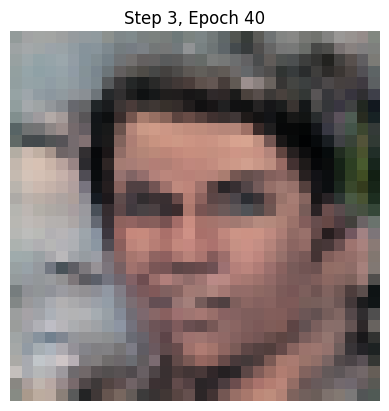

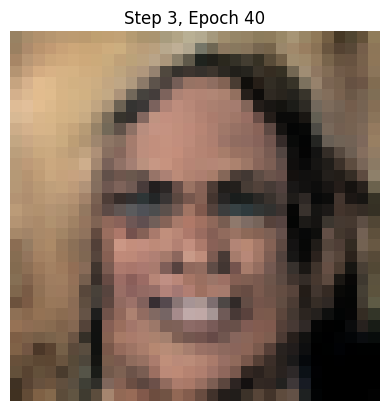

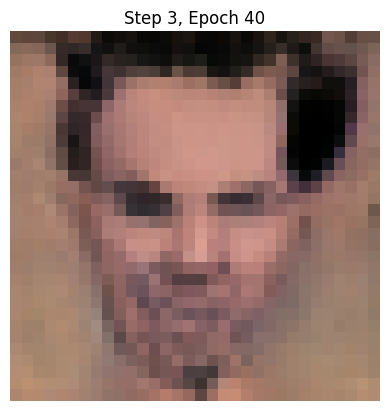

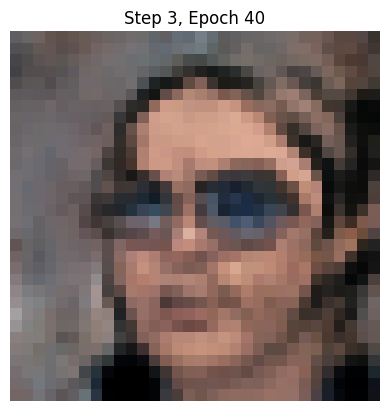

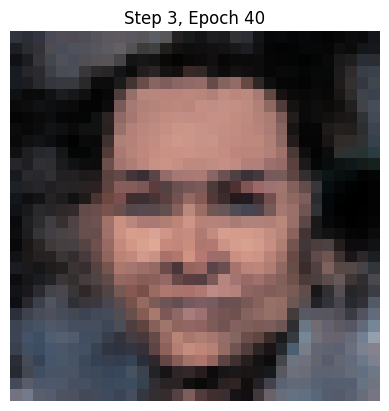

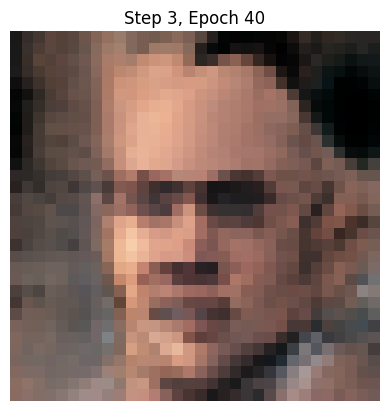

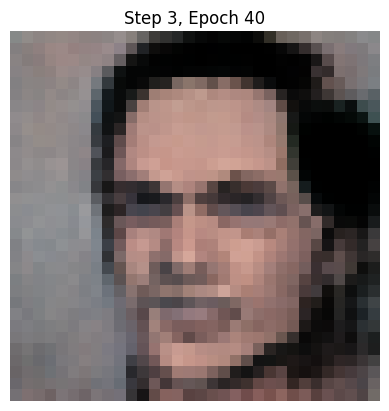

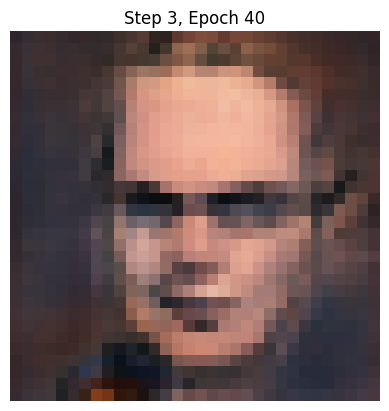

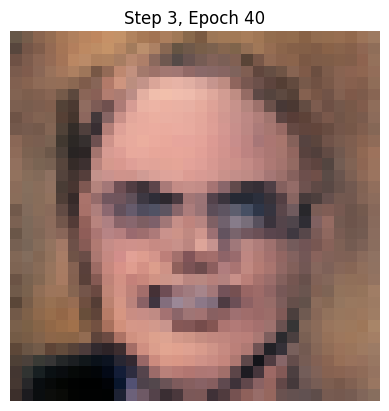

Step 3 
Current image size: 64
Epoch [1/40]


100%|██████████| 313/313 [03:41<00:00,  1.41it/s, gp=0.0235, loss_critic=-3.72] 


Epoch [2/40]


100%|██████████| 313/313 [15:15<00:00,  2.92s/it, gp=0.0311, loss_critic=-4.22] 


Epoch [3/40]


100%|██████████| 313/313 [25:15<00:00,  4.84s/it, gp=0.0763, loss_critic=-2.56]


Epoch [4/40]


100%|██████████| 313/313 [24:17<00:00,  4.66s/it, gp=0.0664, loss_critic=-5.32]


Epoch [5/40]


100%|██████████| 313/313 [23:32<00:00,  4.51s/it, gp=0.0791, loss_critic=-5.61]


Epoch [6/40]


100%|██████████| 313/313 [24:05<00:00,  4.62s/it, gp=0.0479, loss_critic=-4.98]


Epoch [7/40]


100%|██████████| 313/313 [24:03<00:00,  4.61s/it, gp=0.0466, loss_critic=-4.83]


Epoch [8/40]


100%|██████████| 313/313 [24:07<00:00,  4.62s/it, gp=0.0657, loss_critic=-3.73] 


Epoch [9/40]


100%|██████████| 313/313 [24:07<00:00,  4.63s/it, gp=0.0703, loss_critic=-4.98]


Epoch [10/40]


100%|██████████| 313/313 [24:19<00:00,  4.66s/it, gp=0.0334, loss_critic=-2.9] 


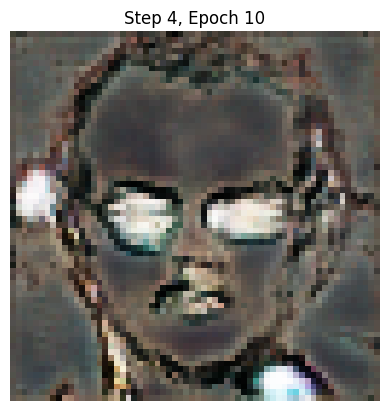

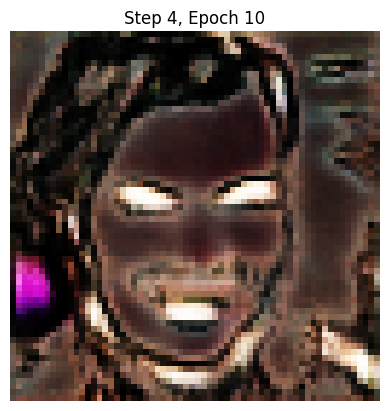

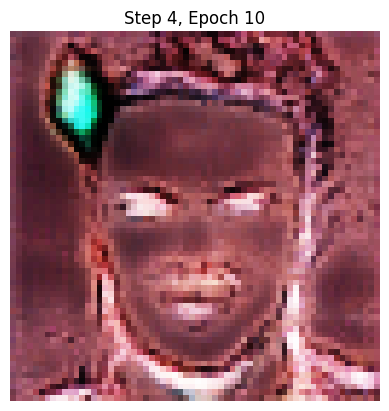

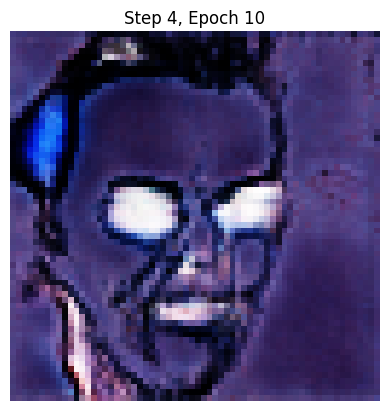

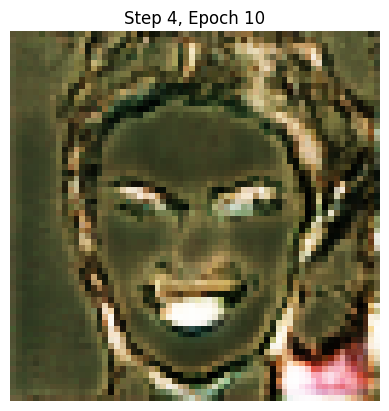

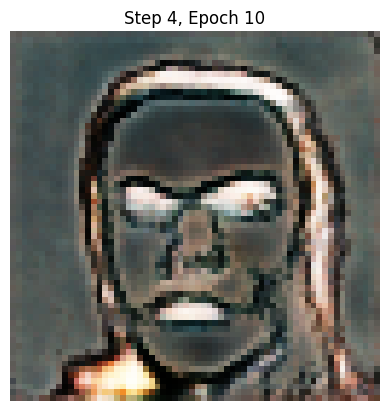

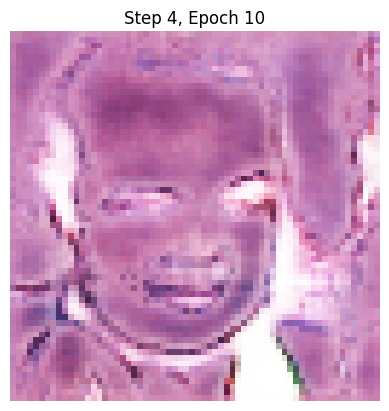

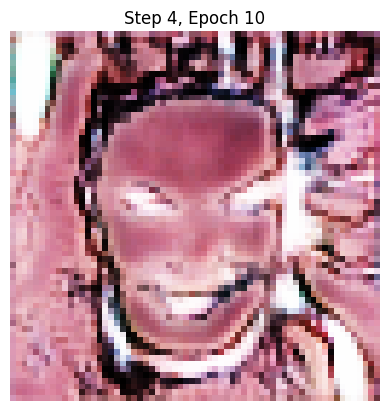

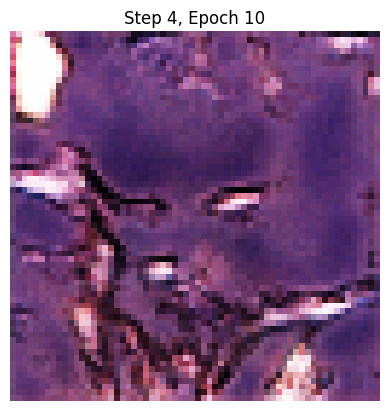

Epoch [11/40]


100%|██████████| 313/313 [24:34<00:00,  4.71s/it, gp=0.032, loss_critic=-4.64] 


Epoch [12/40]


100%|██████████| 313/313 [24:18<00:00,  4.66s/it, gp=0.0213, loss_critic=-4.04]


Epoch [13/40]


100%|██████████| 313/313 [12:09<00:00,  2.33s/it, gp=0.046, loss_critic=-4.19] 


Epoch [14/40]


100%|██████████| 313/313 [03:28<00:00,  1.50it/s, gp=0.0325, loss_critic=-4.15]


Epoch [15/40]


100%|██████████| 313/313 [03:29<00:00,  1.50it/s, gp=0.0238, loss_critic=-2.88] 


Epoch [16/40]


100%|██████████| 313/313 [03:29<00:00,  1.49it/s, gp=0.0395, loss_critic=-2.24]


Epoch [17/40]


100%|██████████| 313/313 [03:39<00:00,  1.42it/s, gp=0.0273, loss_critic=-3.35]


Epoch [18/40]


100%|██████████| 313/313 [03:37<00:00,  1.44it/s, gp=0.0291, loss_critic=-2.52]


Epoch [19/40]


100%|██████████| 313/313 [03:29<00:00,  1.49it/s, gp=0.0261, loss_critic=-2.11]


Epoch [20/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0331, loss_critic=-4.71]


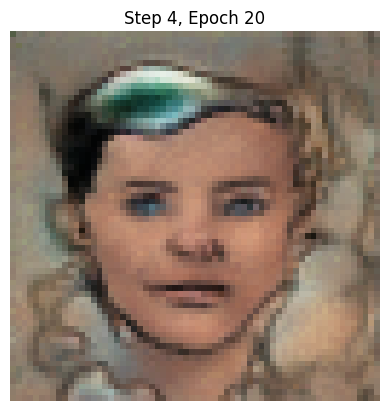

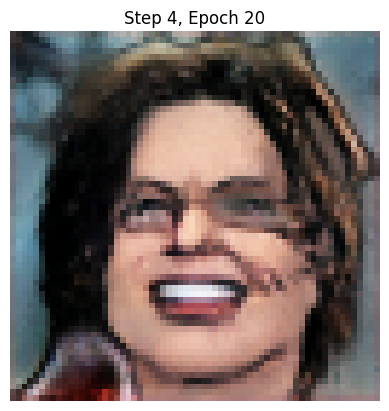

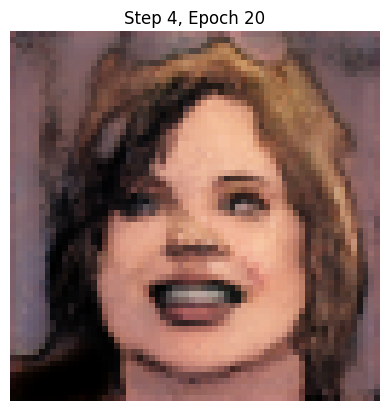

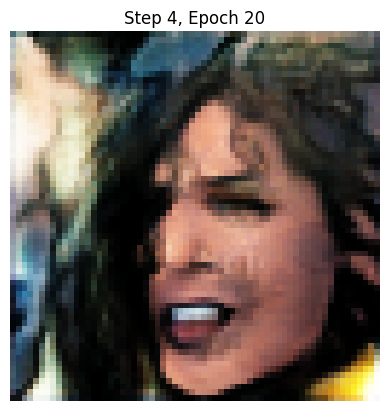

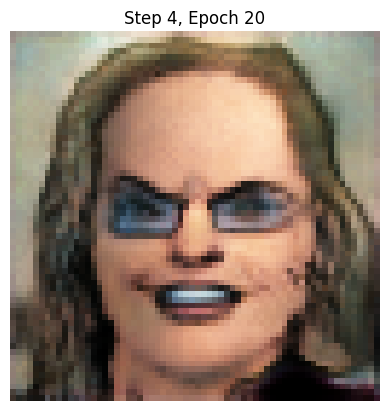

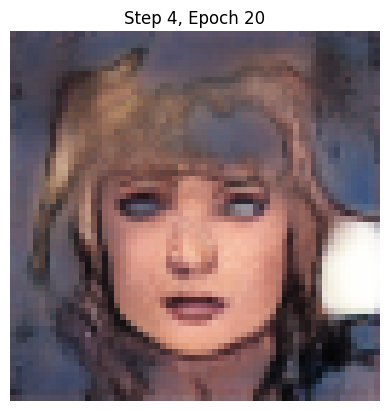

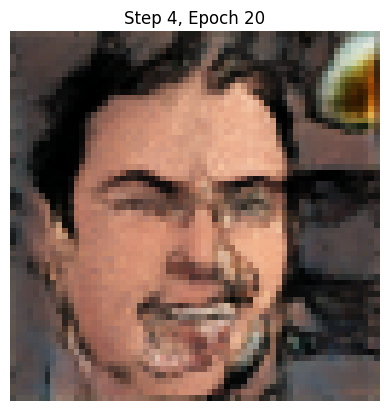

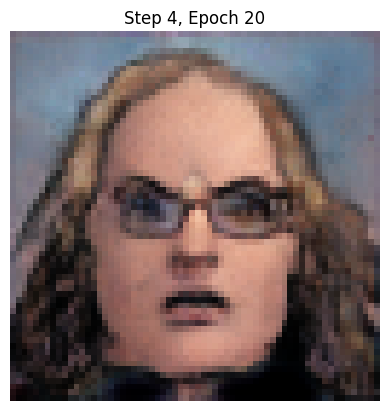

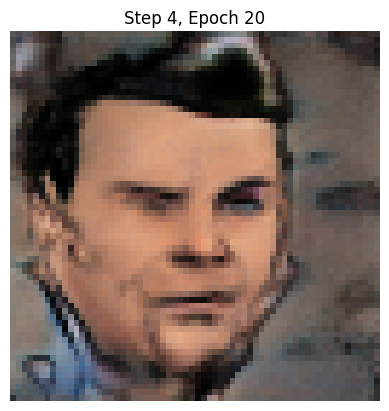

Epoch [21/40]


100%|██████████| 313/313 [03:29<00:00,  1.49it/s, gp=0.0298, loss_critic=-3.06]


Epoch [22/40]


100%|██████████| 313/313 [03:29<00:00,  1.49it/s, gp=0.0267, loss_critic=-2.7] 


Epoch [23/40]


100%|██████████| 313/313 [03:29<00:00,  1.49it/s, gp=0.0238, loss_critic=-3.4] 


Epoch [24/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0664, loss_critic=-2.65]


Epoch [25/40]


100%|██████████| 313/313 [03:31<00:00,  1.48it/s, gp=0.0414, loss_critic=-2.4]  


Epoch [26/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0328, loss_critic=-2.42] 


Epoch [27/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0267, loss_critic=-3.48] 


Epoch [28/40]


100%|██████████| 313/313 [03:29<00:00,  1.49it/s, gp=0.0242, loss_critic=-3.18]


Epoch [29/40]


100%|██████████| 313/313 [03:31<00:00,  1.48it/s, gp=0.0295, loss_critic=-4.51]


Epoch [30/40]


100%|██████████| 313/313 [03:32<00:00,  1.47it/s, gp=0.0195, loss_critic=-3.16] 


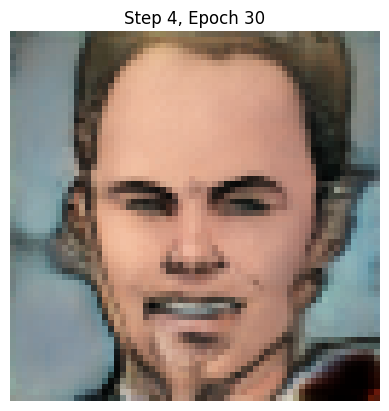

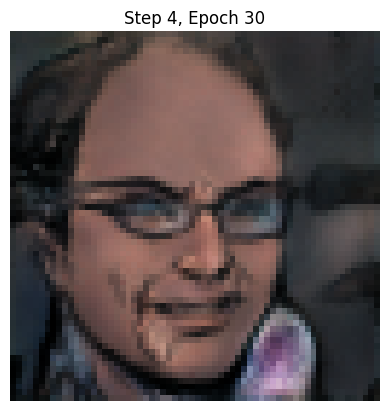

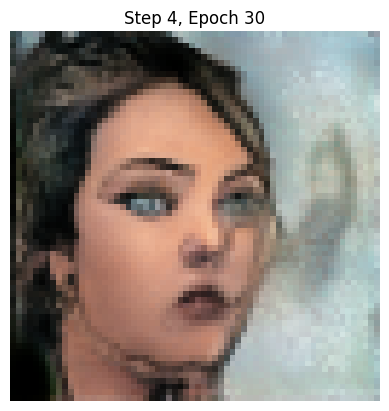

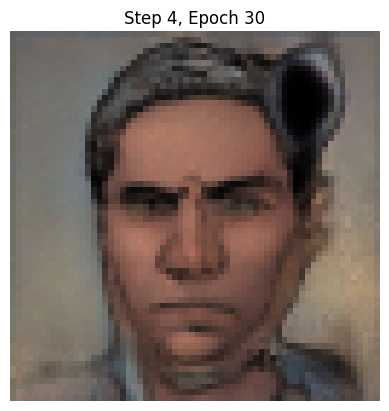

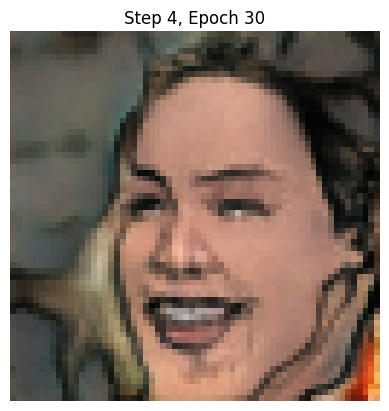

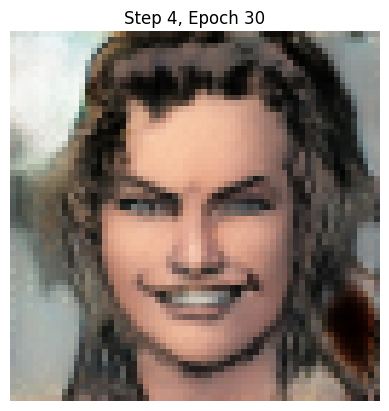

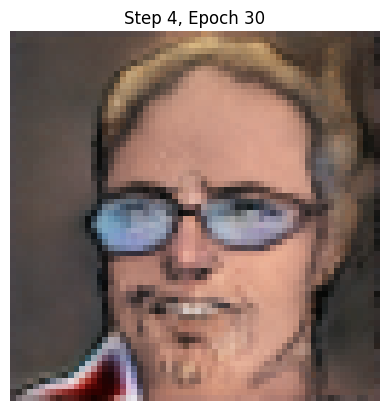

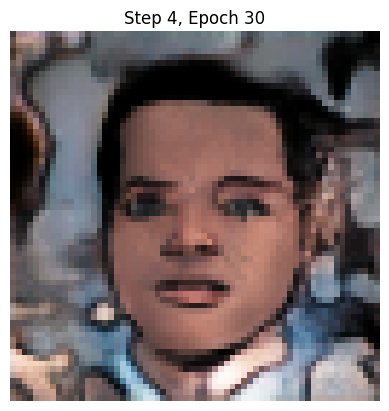

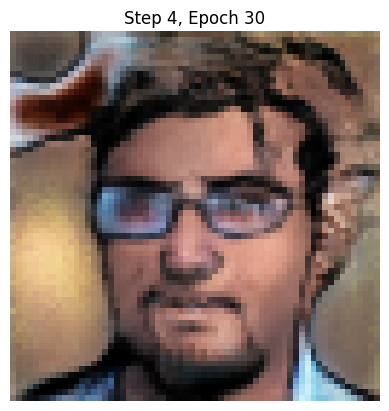

Epoch [31/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0235, loss_critic=-3.6]  


Epoch [32/40]


100%|██████████| 313/313 [03:29<00:00,  1.49it/s, gp=0.0267, loss_critic=-3.31] 


Epoch [33/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0148, loss_critic=-3.52] 


Epoch [34/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.024, loss_critic=-2.91]  


Epoch [35/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0292, loss_critic=-2.52] 


Epoch [36/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0158, loss_critic=-4.3]  


Epoch [37/40]


100%|██████████| 313/313 [03:31<00:00,  1.48it/s, gp=0.0335, loss_critic=-3.06]


Epoch [38/40]


100%|██████████| 313/313 [03:29<00:00,  1.49it/s, gp=0.0275, loss_critic=-3.67] 


Epoch [39/40]


100%|██████████| 313/313 [03:30<00:00,  1.48it/s, gp=0.029, loss_critic=-3.04]  


Epoch [40/40]


100%|██████████| 313/313 [03:30<00:00,  1.49it/s, gp=0.0392, loss_critic=-2.77] 


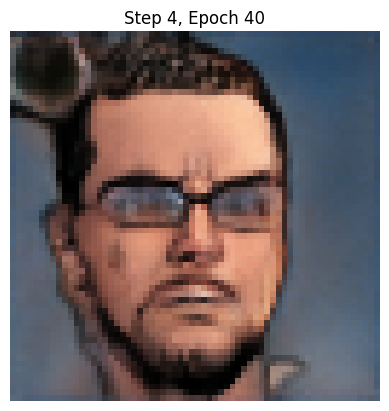

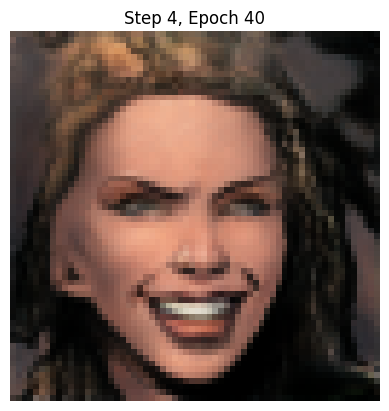

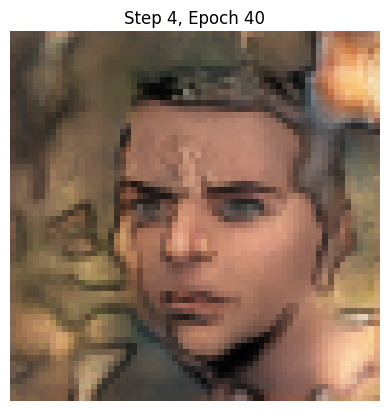

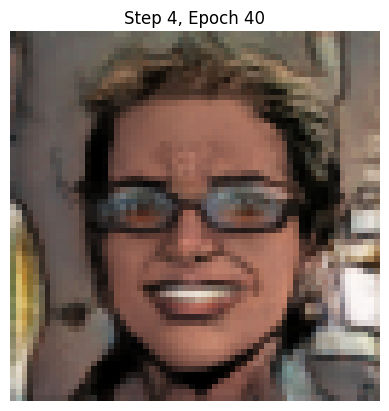

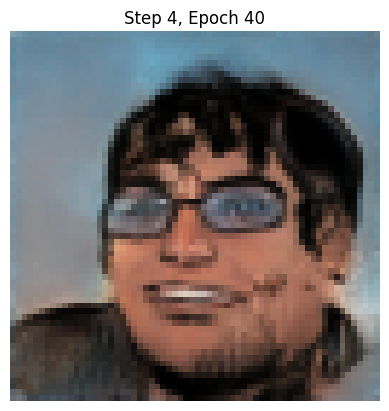

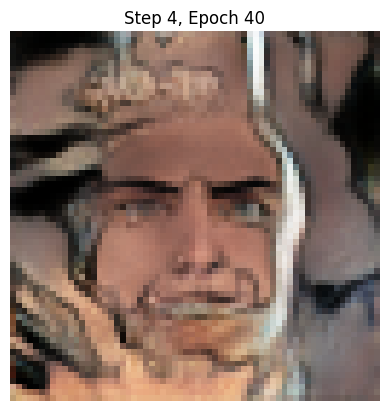

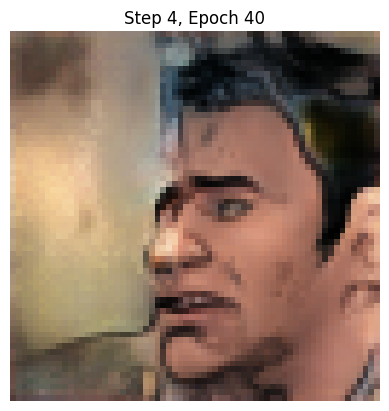

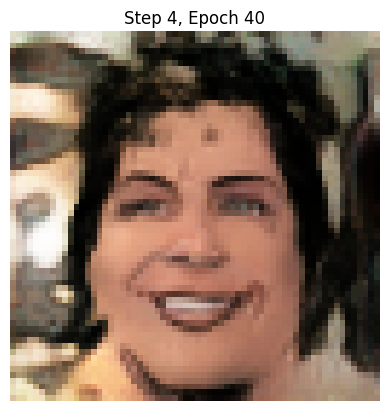

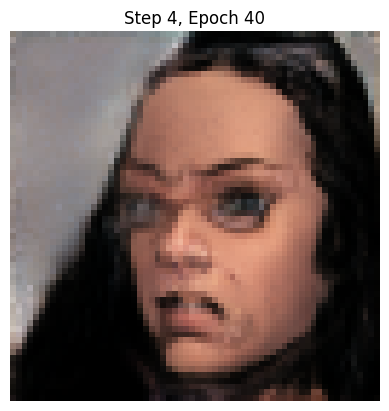

Step 4 
Current image size: 128
Epoch [1/40]


100%|██████████| 625/625 [06:14<00:00,  1.67it/s, gp=0.149, loss_critic=-12]   


Epoch [2/40]


100%|██████████| 625/625 [06:14<00:00,  1.67it/s, gp=0.177, loss_critic=-12.8] 


Epoch [3/40]


100%|██████████| 625/625 [06:15<00:00,  1.66it/s, gp=0.121, loss_critic=-12.8] 


Epoch [4/40]


100%|██████████| 625/625 [06:16<00:00,  1.66it/s, gp=0.106, loss_critic=-9.95] 


Epoch [5/40]


100%|██████████| 625/625 [06:19<00:00,  1.65it/s, gp=0.212, loss_critic=-9.24] 


Epoch [6/40]


100%|██████████| 625/625 [06:12<00:00,  1.68it/s, gp=0.0934, loss_critic=-8.09]


Epoch [7/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.159, loss_critic=-10]   


Epoch [8/40]


100%|██████████| 625/625 [06:11<00:00,  1.68it/s, gp=0.119, loss_critic=-12.1] 


Epoch [9/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.17, loss_critic=-9.92]  


Epoch [10/40]


100%|██████████| 625/625 [06:10<00:00,  1.68it/s, gp=0.137, loss_critic=-8.89] 


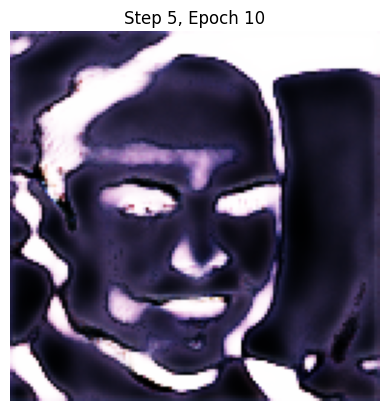

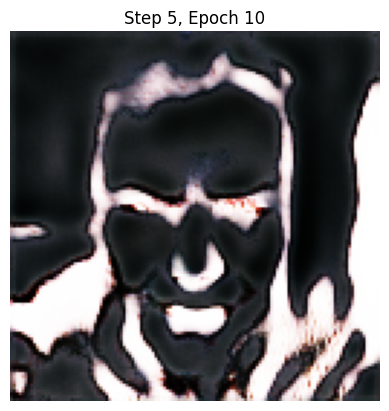

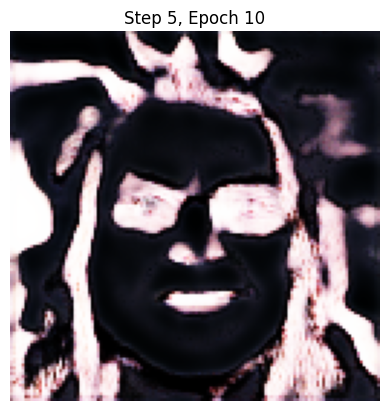

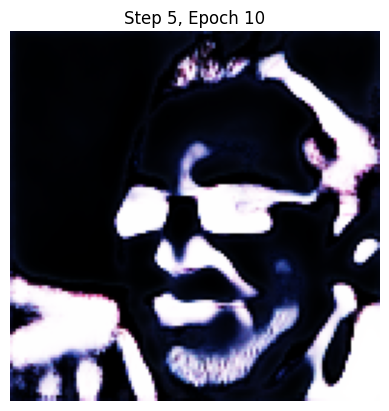

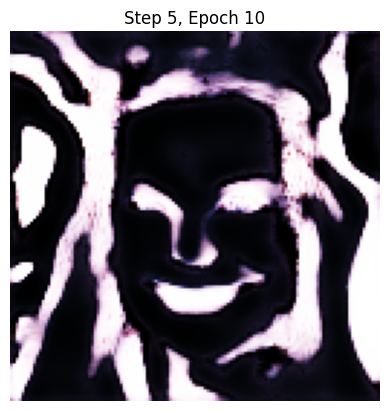

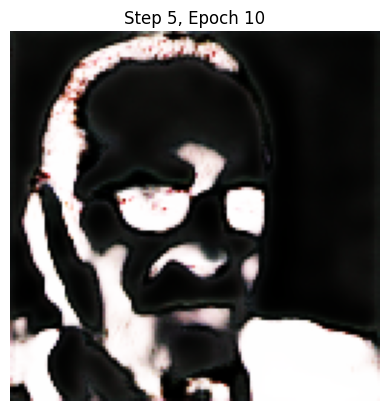

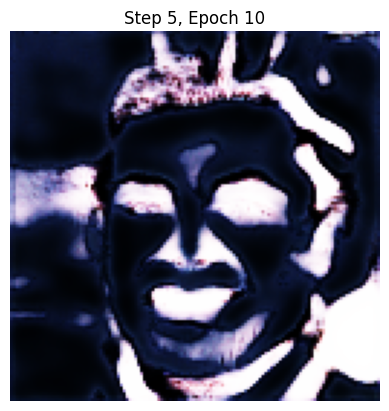

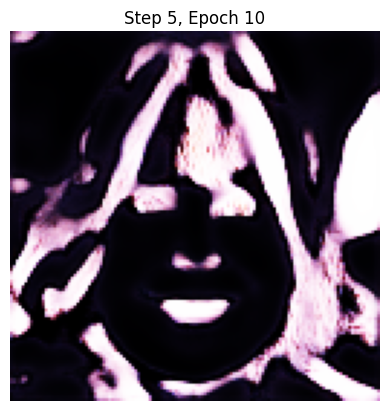

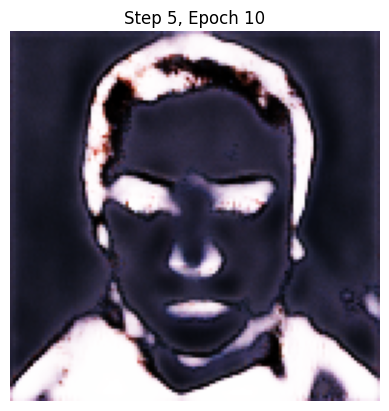

Epoch [11/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.124, loss_critic=-5.15] 


Epoch [12/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.0746, loss_critic=-7.72]


Epoch [13/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.128, loss_critic=-8.4]  


Epoch [14/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.12, loss_critic=-7.02]  


Epoch [15/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.109, loss_critic=-5.95] 


Epoch [16/40]


100%|██████████| 625/625 [06:14<00:00,  1.67it/s, gp=0.122, loss_critic=-7.53] 


Epoch [17/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.107, loss_critic=-5.49] 


Epoch [18/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.129, loss_critic=-11.1] 


Epoch [19/40]


100%|██████████| 625/625 [06:14<00:00,  1.67it/s, gp=0.0989, loss_critic=-8.55]


Epoch [20/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.101, loss_critic=-8.54] 


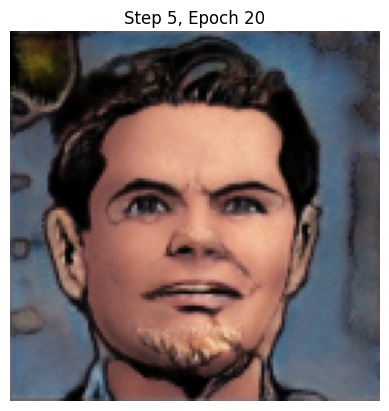

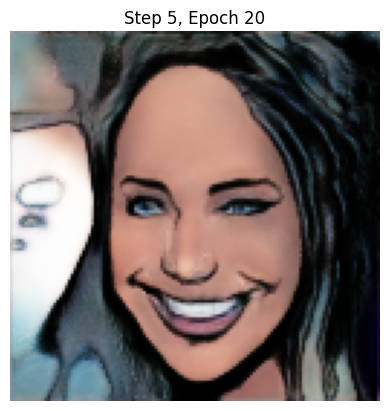

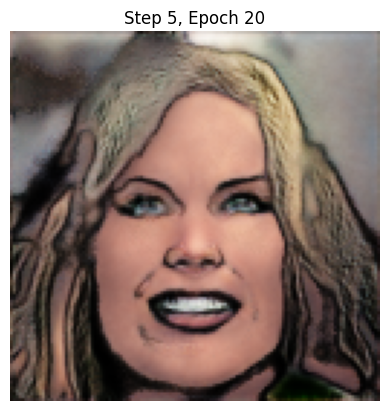

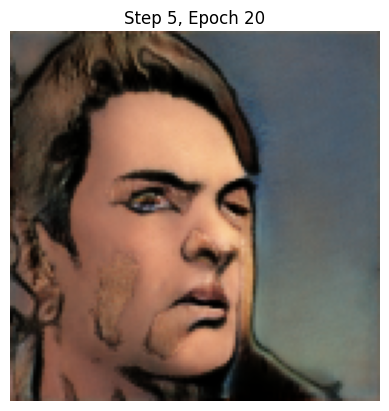

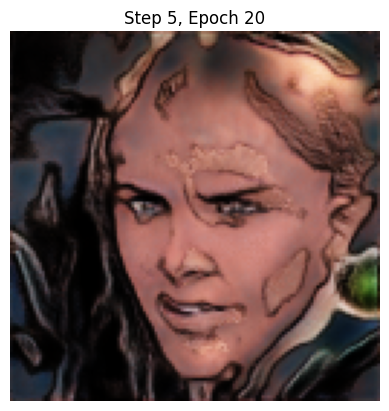

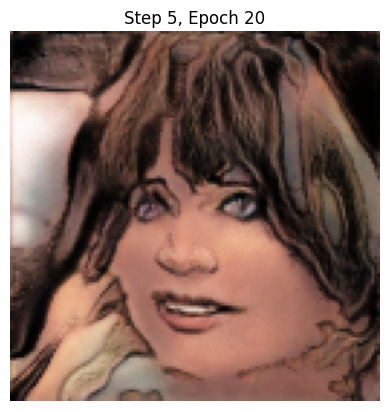

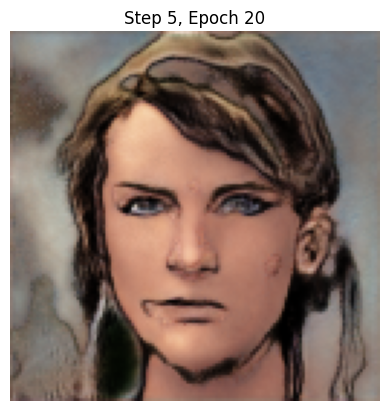

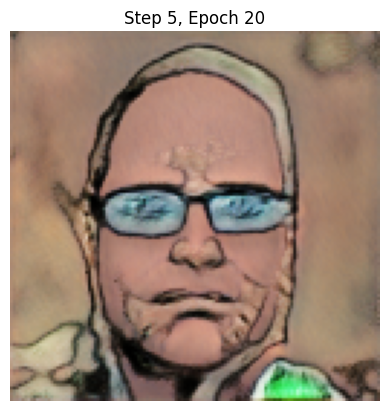

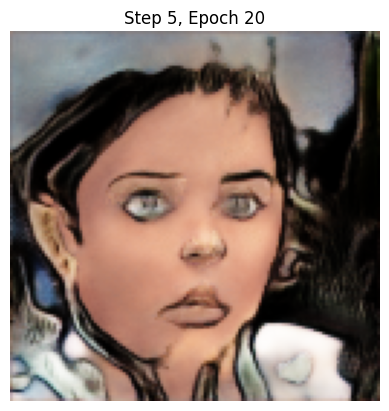

Epoch [21/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.203, loss_critic=-8.19] 


Epoch [22/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.102, loss_critic=-7.7]  


Epoch [23/40]


100%|██████████| 625/625 [06:14<00:00,  1.67it/s, gp=0.0905, loss_critic=-7.01]


Epoch [24/40]


100%|██████████| 625/625 [06:14<00:00,  1.67it/s, gp=0.0865, loss_critic=-8.31]


Epoch [25/40]


100%|██████████| 625/625 [06:16<00:00,  1.66it/s, gp=0.113, loss_critic=-8.74] 


Epoch [26/40]


100%|██████████| 625/625 [06:14<00:00,  1.67it/s, gp=0.0757, loss_critic=-8.92]


Epoch [27/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.147, loss_critic=-7.74] 


Epoch [28/40]


100%|██████████| 625/625 [06:14<00:00,  1.67it/s, gp=0.0686, loss_critic=-5.36] 


Epoch [29/40]


100%|██████████| 625/625 [06:13<00:00,  1.67it/s, gp=0.0689, loss_critic=-9.32]


Epoch [30/40]


100%|██████████| 625/625 [06:12<00:00,  1.68it/s, gp=0.126, loss_critic=-5.17] 


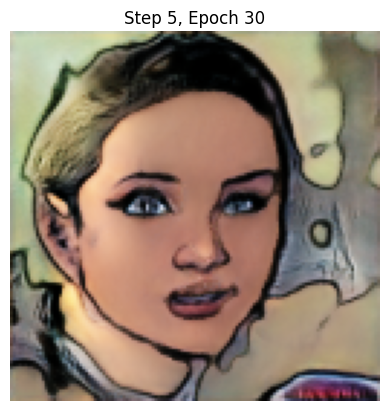

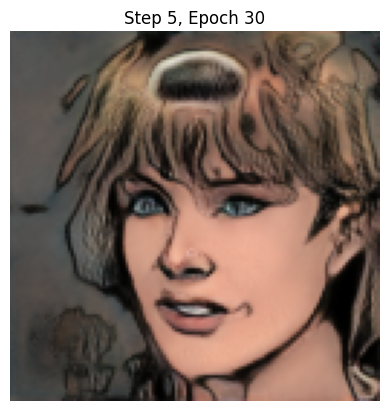

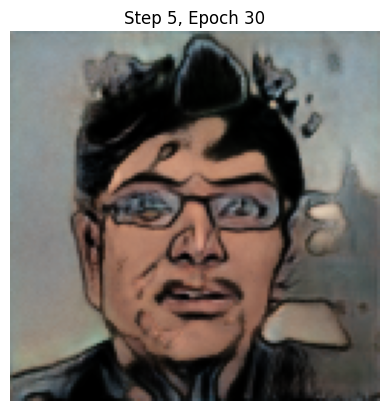

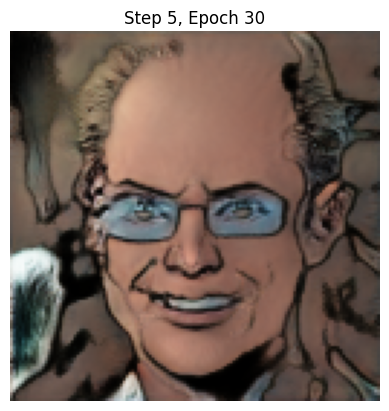

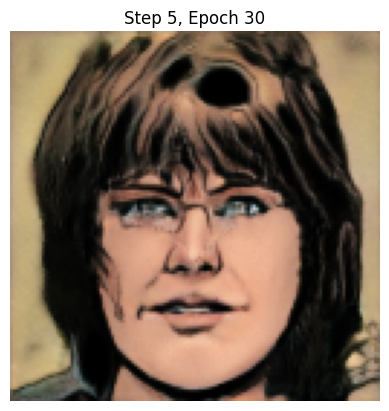

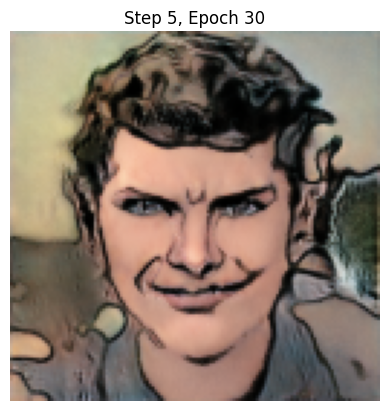

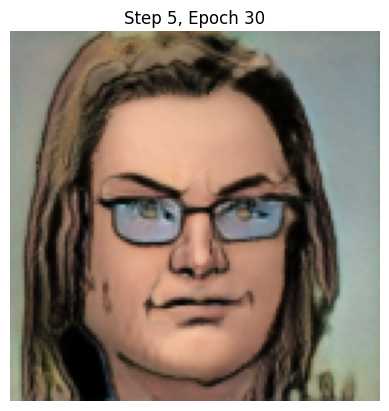

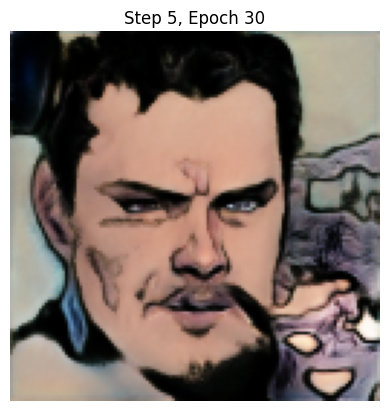

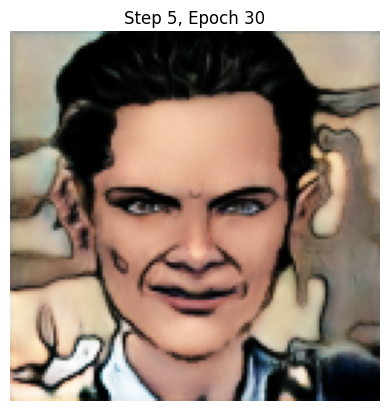

Epoch [31/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.0766, loss_critic=-6.42]


Epoch [32/40]


100%|██████████| 625/625 [06:11<00:00,  1.68it/s, gp=0.0698, loss_critic=-5.71]


Epoch [33/40]


100%|██████████| 625/625 [06:11<00:00,  1.68it/s, gp=0.0945, loss_critic=-7.16]


Epoch [34/40]


100%|██████████| 625/625 [06:12<00:00,  1.68it/s, gp=0.062, loss_critic=-5.39] 


Epoch [35/40]


100%|██████████| 625/625 [06:11<00:00,  1.68it/s, gp=0.108, loss_critic=-5.09] 


Epoch [36/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.113, loss_critic=-6.66] 


Epoch [37/40]


100%|██████████| 625/625 [06:11<00:00,  1.68it/s, gp=0.103, loss_critic=-9.33] 


Epoch [38/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.125, loss_critic=-8.36] 


Epoch [39/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.111, loss_critic=-7.26] 


Epoch [40/40]


100%|██████████| 625/625 [06:10<00:00,  1.69it/s, gp=0.103, loss_critic=-10.6] 


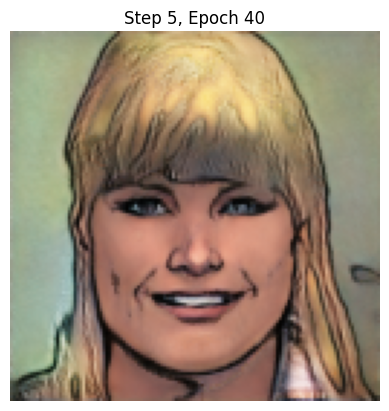

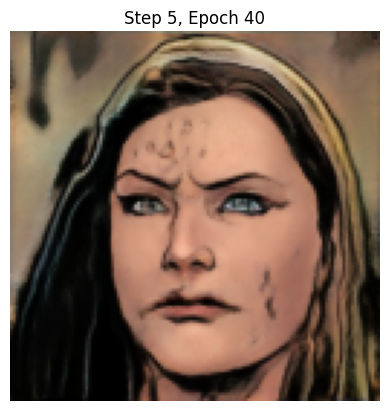

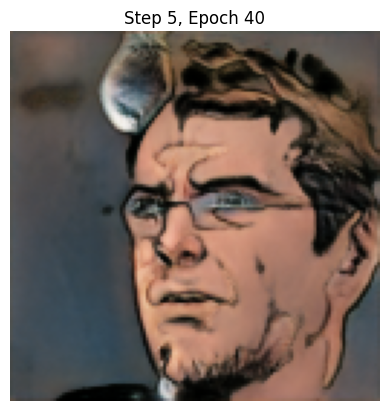

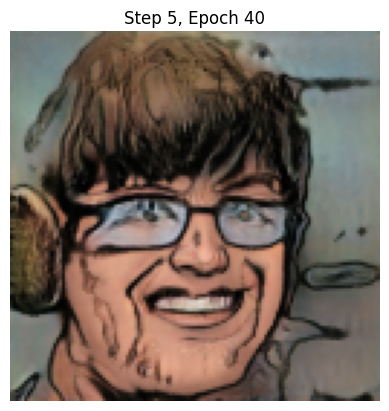

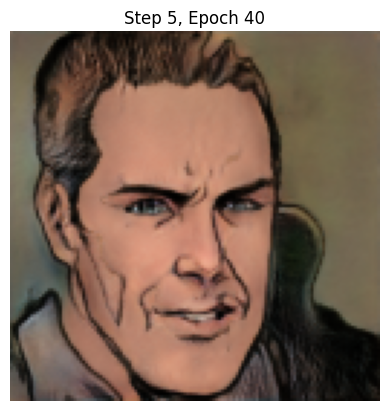

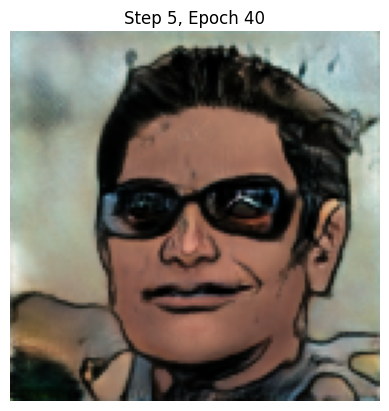

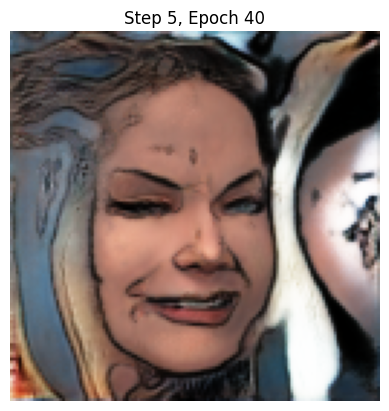

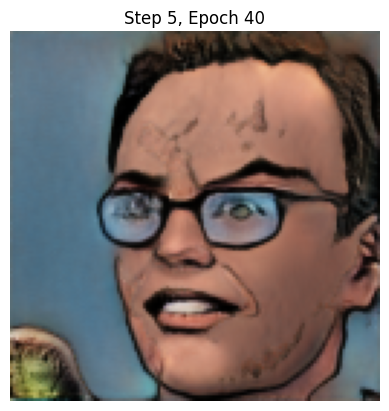

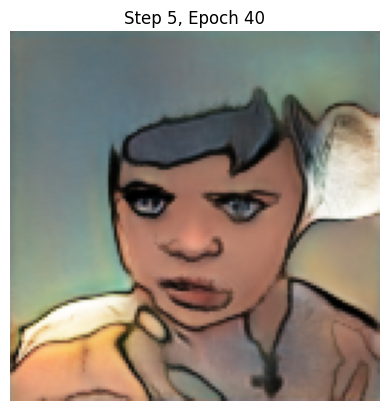

Step 5 


In [ ]:
generator = Generator(Z_DIM, W_DIM, IN_CHANNELS, CHANNELIMAGE).to(DEVICE)
critic = Discriminator(IN_CHANNELS, CHANNELIMAGE).to(DEVICE)
opt_generator = optim.Adam(
    [
        {"params": [param for name, param in generator.named_parameters() if "map" not in name]},
        {"params": generator.map.parameters(), "lr": 1e-5},
    ],
    lr=LR,
    betas=(0.0, 0.99),
)
opt_critic = optim.Adam(critic.parameters(), lr=LR, betas=(0.0, 0.99))

step = int(log2(START_TRAIN_IMG_SIZE / 4))
os.makedirs("loss_plots", exist_ok=True)

for num_epochs in PROGRESSIVE_EPOCHS[step:]:
    alpha = 1e-7
    loader, dataset = loaddata(4 * 2 ** step)
    print(f"Current image size: {4 * 2 ** step}")

    loss_gen_all, loss_critic_all = [], []

    for epoch in range(num_epochs):
        print(f"Epoch [{epoch + 1}/{num_epochs}]")
        alpha, loss_gen, loss_critic = trainloop(
            critic, generator, loader, dataset, step, alpha, opt_critic, opt_generator
        )
        loss_gen_all.extend(loss_gen)
        loss_critic_all.extend(loss_critic)

        if (epoch + 1) % 10 == 0:
            save_and_display_images(generator, step, epoch + 1)

    print(f"Step {step} ")
    step += 1


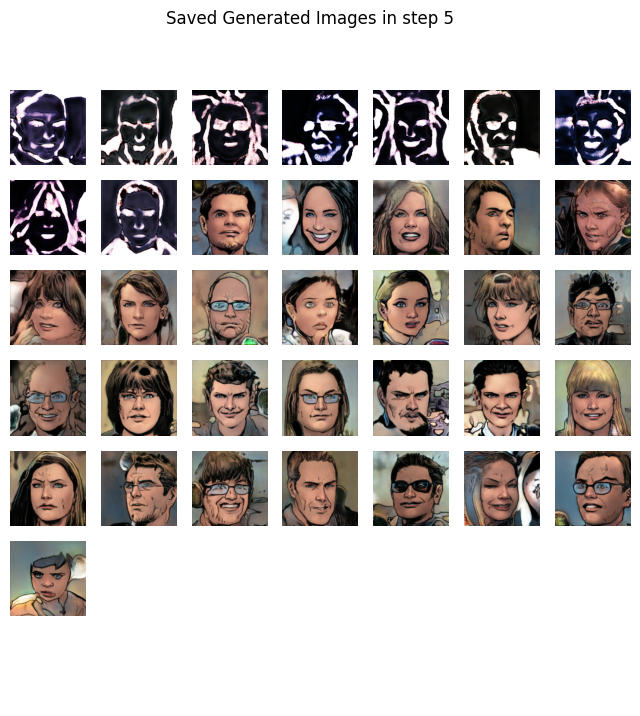

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def display_saved_images(image_dir):
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('png', 'jpg', 'jpeg'))]

    # Display images
    fig, axs = plt.subplots(7, 7, figsize=(8, 8))
    for i, ax in enumerate(axs.flatten()):
        if i < len(image_files):
            image_path = os.path.join(image_dir, image_files[i])
            img = Image.open(image_path)
            ax.imshow(img)
            ax.axis('off')
        else:
            ax.axis('off')
    plt.suptitle("Saved Generated Images in step 5")
    plt.show()

# Directory where images are saved
image_dir = 'Finalimages/step_5'

# Display saved images
display_saved_images(image_dir)


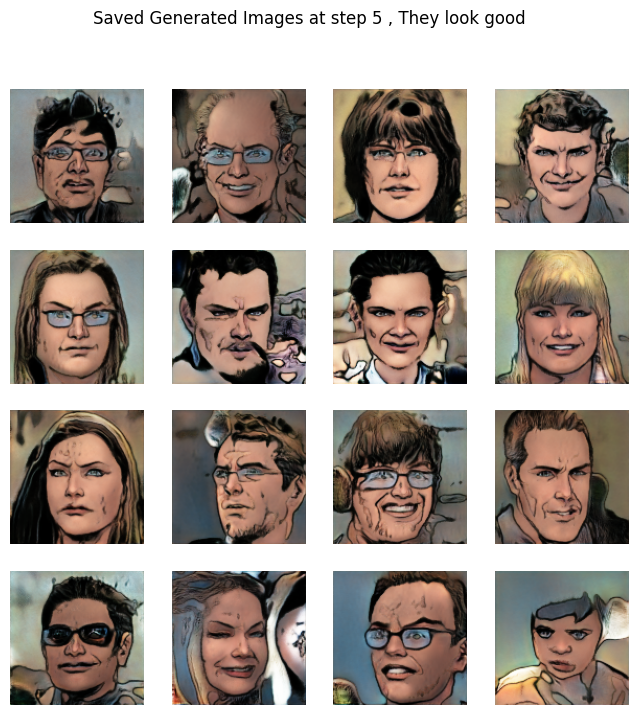

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def display_saved_images(image_dir, num_images=16):
    # Get list of image file names in the directory
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('png', 'jpg', 'jpeg'))]
    image_files = image_files[-num_images:]

    # Display images
    grid_size = int(num_images**0.5)
    fig, axs = plt.subplots(grid_size, grid_size, figsize=(8, 8))
    for i, ax in enumerate(axs.flatten()):
        if i < len(image_files):
            image_path = os.path.join(image_dir, image_files[i])
            img = Image.open(image_path)
            ax.imshow(img)
            ax.axis('off')
        else:
            ax.axis('off')
    plt.suptitle("Saved Generated Images at step 5 , They look good")
    plt.show()


image_dir = 'Finalimages/step_5'


display_saved_images(image_dir, num_images=16)
